In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from dataclasses import dataclass

from tqdm.auto import tqdm, trange

import orjson
import torch
import torch.nn as nn
import torch.nn.functional as F
from sklearn.metrics import accuracy_score
from torch.utils.data import DataLoader, TensorDataset, random_split
from tqdm.auto import tqdm, trange

from sae_java_bug.logger import logger
from sae_java_bug.sparse_autoencoders.utils import get_device

from typing import List
from collections import defaultdict

@dataclass
class VulnerabilityData:
    vulnerable: torch.Tensor
    secure: torch.Tensor


In [3]:
import glob
import orjson
import torch
from tqdm.auto import tqdm
from sae_java_bug.sparse_autoencoders.sae_exploration import ActivationsSchema

from sae_java_bug.logger import logger
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
import numpy as np
from typing import Dict, Tuple
from sklearn.model_selection import KFold

class MLP(nn.Module):
    def __init__(
        self, input_dim, output_dim=2, hidden=(128, 64), dropout=0.3, use_bn=True
    ):
        super().__init__()
        h1, h2 = hidden
        self.use_bn = use_bn

        self.fc1 = nn.Linear(input_dim, h1)
        self.bn1 = nn.BatchNorm1d(h1) if use_bn else nn.Identity()
        self.fc2 = nn.Linear(h1, h2)
        self.bn2 = nn.BatchNorm1d(h2) if use_bn else nn.Identity()
        self.fc3 = nn.Linear(h2, output_dim)
        self.drop = nn.Dropout(dropout)

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = F.relu(x)
        x = self.drop(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = F.relu(x)
        x = self.drop(x)

        x = self.fc3(x)  # logits
        return x

def evaluate(loader, model, device=get_device(verbose=False)):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for x, y in loader:
            x, y = x.to(device), y.to(device)
            logits = model(x)
            preds = logits.argmax(dim=1)
            all_preds.append(preds.cpu())
            all_labels.append(y.cpu())
    y_true = torch.cat(all_labels)
    y_pred = torch.cat(all_preds)
    return accuracy_score(y_true, y_pred), y_true, y_pred

def train_small_mlp_kfold(class_negative: torch.Tensor, class_positive: torch.Tensor, k=5):

    # Create labels
    vuln_labels = torch.ones(class_positive.size(0), dtype=torch.float32)
    safe_labels = torch.zeros(class_negative.size(0), dtype=torch.float32)

    all_features = torch.cat((class_positive, class_negative), dim=0).float()
    all_labels = torch.cat((vuln_labels, safe_labels), dim=0).long()

    # print("All Features Shape:", all_features.shape)
    # print("All Labels Shape:", all_labels.shape)

    dataset = TensorDataset(all_features, all_labels)

    # Initialize KFold
    kf = KFold(n_splits=k, shuffle=True, random_state=42)

    fold = 1
    fold_acc = []

    for train_idx, test_idx in kf.split(all_features):

        # print(f"\n===== Fold {fold}/{k} =====")
        fold += 1

        train_subset = torch.utils.data.Subset(dataset, train_idx)
        test_subset  = torch.utils.data.Subset(dataset, test_idx)

        train_loader = DataLoader(train_subset, batch_size=32, shuffle=True, drop_last=True)
        test_loader  = DataLoader(test_subset, batch_size=1000, shuffle=False, drop_last=False)

        # new model per fold
        model = MLP(input_dim=all_features.size(1)).to(device)
        # activate gradients
        model.train()
        torch.set_grad_enabled(True)
        optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)

        num_epochs = 50  # often fewer needed

        for epoch in range(num_epochs):
            model.train()
            for x_batch, y_batch in train_loader:
                x_batch, y_batch = x_batch.to(device), y_batch.to(device)

                optimizer.zero_grad()
                logits = model(x_batch)
                loss = F.cross_entropy(logits, y_batch)
                loss.backward()
                optimizer.step()

        # evaluate this fold
        acc, _, _ = evaluate(test_loader, model, device)
        fold_acc.append(acc)

    #     print(f"Fold Test Accuracy: {acc:.4f}")

    # print("\n===== K-Fold Results =====")
    # print(f"Fold Accuracies: {fold_acc}")
    # print(f"Mean Accuracy: {sum(fold_acc)/len(fold_acc):.4f}")

    return sum(fold_acc)/len(fold_acc)


device = get_device(verbose=True)

layer_scores = {}
RUN_ID = "run_20260127_044329"
RUN_ID = "run_20260127_195450" # this is the swapped operands activations
RUN_ID = "run_20260127_202722" # this is the cwes data
RUN_ID = "run_20260128_184854" # Trained with DeltaSeccommits
RUN_ID = "run_20260131_190935_rufimelo_secure_code_qwen_coder_strd_16384"
RUN_ID = "run_20260202_220441_rufimelo_secure_code_qwen_coder_topk_16384"
RUN_ID = "run_20260204_050125_rufimelo_secure_code_qwen_coder_strd_16384_raw"
RUN_ID = "secure_code_qwen_coder_strd_16384"
RUN_ID = "run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M"

@dataclass
class VulnerabilityData:
    vulnerable: torch.Tensor
    secure: torch.Tensor


def compute_lda_fisher_scores(secure_features: torch.Tensor, vulnerable_features: torch.Tensor) -> float:
    # Create labels
    vuln_labels = torch.ones(vulnerable_features.size(0), dtype=torch.float32)
    safe_labels = torch.zeros(secure_features.size(0), dtype=torch.float32)
    all_features = torch.cat((vulnerable_features, secure_features), dim=0).float()
    all_labels = torch.cat((vuln_labels, safe_labels), dim=0).long()

    # LDA — build dataset for layer
    X = all_features.numpy()
    y = all_labels.numpy()

    # Train LDA
    lda = LinearDiscriminantAnalysis(n_components=1)
    proj = lda.fit_transform(X, y)

    vuln_proj = proj[: len(vulnerable_features)]
    safe_proj = proj[len(vulnerable_features):]

    mean_diff = vuln_proj.mean() - safe_proj.mean()
    var_sum = vuln_proj.var() + safe_proj.var()
    fisher_score = (mean_diff ** 2) / (var_sum + 1e-8)

    return float(fisher_score)
def process_files(
    files
):
    FisherScoreMap: Dict[Tuple[str, str], float] = {}
    ProbingDataMap: Dict[Tuple[str, str], float] = {}

    all_vulnerable_features: Dict[str, List[float]] = defaultdict(list)
    all_safe_features : Dict[str, List[float]] = defaultdict(list)

    for activation_file in files:
        logger.info("Processing file.", file=activation_file)

        cwe_tensor_map: Dict[str, VulnerabilityData] = {}
        vulnerable_features = torch.tensor([])
        safe_features = torch.tensor([])
        
        # Loads activations.
        with open(activation_file, "r") as f: 
            for line in tqdm(f, desc="Loading", unit="lines", total=2500):
                try:
                    data = orjson.loads(line)
                except orjson.JSONDecodeError as e:
                    logger.error(f"JSON decoding error: {e}")
                    # skip to the next file
                    break
                
                cwe = data["cwe"]
                if cwe not in cwe_tensor_map:
                    cwe_tensor_map[cwe] = VulnerabilityData(
                        vulnerable=torch.tensor([]),
                        secure=torch.tensor([]),
                    )

                activations = ActivationsSchema(**data)
                vuln_tensor = torch.tensor(activations.vulnerable)
                safe_tensor = torch.tensor(activations.secure)


                vulnerable_features = torch.cat(
                    (vulnerable_features, vuln_tensor.unsqueeze(0)), dim=0
                )
                safe_features = torch.cat((safe_features, safe_tensor.unsqueeze(0)), dim=0)
                

                cwe_tensor_map[cwe] = VulnerabilityData(
                    vulnerable=torch.cat(
                        (cwe_tensor_map[cwe].vulnerable, vuln_tensor.unsqueeze(0)), dim=0
                    ),
                    secure=torch.cat(
                        (cwe_tensor_map[cwe].secure, safe_tensor.unsqueeze(0)), dim=0
                    ),
                )

            print("Vulnerable Features Shape:", vulnerable_features.shape , "Safe Features Shape:", safe_features.shape)
            print("CWE:", cwe, "Vulnerable Shape:", vulnerable_features.shape, "Safe Shape:", safe_features.shape)
        
            all_vulnerable_features[
                "layer_" + activation_file.split("layer_")[1].split("_")[0]
            ] = torch.tensor(vulnerable_features)
            all_safe_features[
                "layer_" + activation_file.split("layer_")[1].split("_")[0]
            ]= torch.tensor(safe_features)
            

        # Save for later reuse
        layer_id = activation_file.split("layer_")[1].split("_")[0]
        torch.save(vulnerable_features, f"../../artifacts/activations/{RUN_ID}/vulnerable_layer_{layer_id}.pt")
        torch.save(safe_features, f"../../artifacts/activations/{RUN_ID}/safe_layer_{layer_id}.pt")

    return FisherScoreMap, ProbingDataMap, all_vulnerable_features, all_safe_features



2026-02-26 17:37:24 [info     ] Getting device.                device=cpu
2026-02-26 17:37:28 [info     ] Getting device.                device=cpu


In [4]:
files = sorted(glob.glob(f"../../artifacts/activations/{RUN_ID}/activations_layer_*"), key=lambda x: int(x.split("layer_")[1].split("_")[0]))

FisherScoreMap, ProbingDataMap, all_vulnerable_features, all_safe_features = process_files(
    files
)

secure_activations = all_safe_features["layer_11"]
vulnerable_activations = all_vulnerable_features["layer_11"]

2026-02-26 17:37:28 [info     ] Processing file.               file=../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl


Loading:   0%|          | 0/2500 [00:00<?, ?lines/s]

Vulnerable Features Shape: torch.Size([2493, 16384]) Safe Features Shape: torch.Size([2493, 16384])
CWE: CWE-787 Vulnerable Shape: torch.Size([2493, 16384]) Safe Shape: torch.Size([2493, 16384])


/var/folders/pw/7hr2k18x7713lgrp51kl_3080000gn/T/ipykernel_7345/2525961950.py:220: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ] = torch.tensor(vulnerable_features)
/var/folders/pw/7hr2k18x7713lgrp51kl_3080000gn/T/ipykernel_7345/2525961950.py:223: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ]= torch.tensor(safe_features)


In [27]:
cwe_buffer = defaultdict(lambda: {"vulnerable": [], "secure": []})
cwe_buffer

defaultdict(<function __main__.<lambda>()>, {})

In [5]:
# deltasec_loader_fast.py

from dataclasses import dataclass
from collections import defaultdict
from typing import Dict, List
import torch
import orjson
from tqdm import tqdm
from sae_java_bug.logger import logger
from sae_java_bug.sparse_autoencoders.sae_exploration import ActivationsSchema


@dataclass
class VulnerabilityData:
    vulnerable: torch.Tensor
    secure: torch.Tensor


def load_deltasec_activations(files: List[str], max_lines: int = 2500) -> Dict[str, VulnerabilityData]:

    # accumulate in python lists (fast)
    cwe_buffer = defaultdict(lambda: {"vulnerable": [], "secure": []})

    for activation_file in files:
        logger.info("Processing DeltaSec file", file=activation_file)

        with open(activation_file, "r") as f:
            for idx, line in enumerate(tqdm(f, desc=f"Loading {activation_file}")):
                if max_lines and idx >= max_lines:
                    break

                try:
                    data = orjson.loads(line)
                except orjson.JSONDecodeError:
                    continue

                cwe = data["cwe"]
                acts = ActivationsSchema(**data)

                cwe_buffer[cwe]["vulnerable"].append(
                    torch.tensor(acts.vulnerable, dtype=torch.float32)
                )
                cwe_buffer[cwe]["secure"].append(
                    torch.tensor(acts.secure, dtype=torch.float32)
                )

    # stack once
    final_map = {}
    for cwe, tensors in cwe_buffer.items():
        final_map[cwe] = VulnerabilityData(
            vulnerable=torch.stack(tensors["vulnerable"]),
            secure=torch.stack(tensors["secure"]),
        )

    return final_map


class SecureCoactivationEstimatorFast:

    def __init__(self, secure_activations: torch.Tensor, epsilon: float = 1e-6, device="cpu"):

        self.device = device
        self.epsilon = epsilon

        X = (secure_activations > epsilon).float().to(device)

        self.n_samples, self.n_features = X.shape

        # vectorized coactivation
        self.coactivation_matrix = (X.T @ X) / self.n_samples


    def score_sample(self, sample: torch.Tensor):

        active_idx = torch.where(sample > self.epsilon)[0]

        if len(active_idx) < 2:
            return 0.0

        # extract submatrix
        submatrix = self.coactivation_matrix[active_idx][:, active_idx]

        # count violations: coactivation < 1 (i.e., not common in secure data)
        violations = (submatrix < 1e-4).float().sum()

        total_pairs = len(active_idx) * (len(active_idx) - 1) / 2

        return (violations / (total_pairs + 1e-8)).item()



In [56]:
class SecureBernoulliEstimator:

    def __init__(self, secure_activations, epsilon=1e-6):

        X = (secure_activations > epsilon).float()
        self.p = X.mean(dim=0).clamp(1e-6, 1 - 1e-6)
        self.epsilon = epsilon

    def score_population(self, population):

        X = (population > self.epsilon).float()

        nll = -(
            X * torch.log(self.p)
            + (1 - X) * torch.log(1 - self.p)
        ).sum(dim=1)

        return nll.cpu().tolist()


In [6]:
# ==============================
# Preliminary Bernoulli NLL Evaluation
# ==============================

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score, precision_recall_curve, auc


# -------------------------------------------------
# 1. Truncate to first 2048 features (fast mode)
# -------------------------------------------------
secure_acts = all_safe_features["layer_11"].float()
vuln_acts   = all_vulnerable_features["layer_11"].float()

#secure_acts = secure_acts[:, :2048]
#vuln_acts   = vuln_acts[:, :2048]

print("Secure shape:", secure_acts.shape)
print("Vulnerable shape:", vuln_acts.shape)


# -------------------------------------------------
# 2. Fit Bernoulli model on secure activations
# -------------------------------------------------

bern_estimator = SecureBernoulliEstimator(secure_acts)

secure_nll = np.array(bern_estimator.score_population(secure_acts))
vuln_nll   = np.array(bern_estimator.score_population(vuln_acts))


# -------------------------------------------------
# 3. Plot NLL Histograms
# -------------------------------------------------
plt.figure(figsize=(8, 5))
plt.hist(secure_nll, bins=40, alpha=0.6, density=True, label="Secure")
plt.hist(vuln_nll, bins=40, alpha=0.6, density=True, label="Vulnerable")

plt.title("Bernoulli NLL Distribution (2048 features)")
plt.xlabel("Negative Log-Likelihood")
plt.ylabel("Density")
plt.legend()
plt.tight_layout()
plt.show()


# -------------------------------------------------
# 4. AUROC
# -------------------------------------------------
y_true = np.concatenate([
    np.zeros(len(secure_nll)),
    np.ones(len(vuln_nll))
])

scores = np.concatenate([secure_nll, vuln_nll])

auroc = roc_auc_score(y_true, scores)

print("\n=== AUROC ===")
print(f"AUROC: {auroc:.4f}")


# -------------------------------------------------
# 5. Precision-Recall Curve
# -------------------------------------------------
precision, recall, _ = precision_recall_curve(y_true, scores)
auprc = auc(recall, precision)

plt.figure(figsize=(6, 5))
plt.plot(recall, precision)
plt.title("Precision-Recall Curve (Bernoulli NLL)")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.tight_layout()
plt.show()

print("\n=== AUPRC ===")
print(f"AUPRC: {auprc:.4f}")


# -------------------------------------------------
# 6. Quick Summary Statistics
# -------------------------------------------------
print("\n=== Summary Statistics ===")
print(f"Secure NLL mean: {secure_nll.mean():.4f}")
print(f"Vulnerable NLL mean: {vuln_nll.mean():.4f}")
print(f"Difference (Vuln - Secure): {(vuln_nll.mean() - secure_nll.mean()):.4f}")


Secure shape: torch.Size([2493, 16384])
Vulnerable shape: torch.Size([2493, 16384])


NameError: name 'SecureBernoulliEstimator' is not defined

Sparse graph nodes: 1959, edges: 1752327


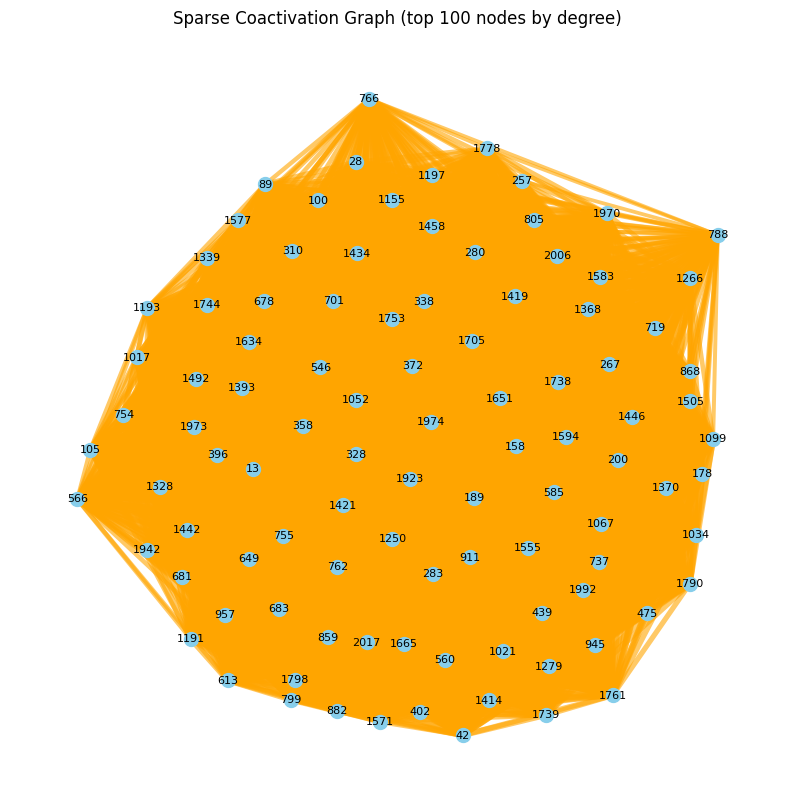

In [59]:
import networkx as nx
import matplotlib.pyplot as plt

# Threshold coactivation to make graph sparse
threshold = 0.05
X = (secure_acts[:, :2048] > 1e-6).float()
coactivation = (X.T @ X) / X.shape[0]

# Build sparse adjacency
G = nx.Graph()
n_features = coactivation.shape[0]
for i in range(n_features):
    for j in range(i + 1, n_features):
        if coactivation[i, j] > threshold:
            G.add_edge(i, j, weight=coactivation[i, j].item())

print(f"Sparse graph nodes: {G.number_of_nodes()}, edges: {G.number_of_edges()}")

# Pick top 100 nodes by degree for visualization
top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:100]
top_node_ids = [n for n, d in top_nodes]
subG = G.subgraph(top_node_ids)

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(subG, seed=42)
edges = subG.edges(data=True)

# Draw nodes
nx.draw_networkx_nodes(subG, pos, node_size=100, node_color='skyblue')

# Draw edges with width proportional to weight
nx.draw_networkx_edges(
    subG,
    pos,
    edgelist=edges,
    width=[5 * d['weight'] for (_, _, d) in edges],
    alpha=0.6,
    edge_color='orange'
)

# Draw labels
nx.draw_networkx_labels(subG, pos, font_size=8)

plt.title("Sparse Coactivation Graph (top 100 nodes by degree)")
plt.axis('off')
plt.show()


Sparse graph nodes: 1959, edges: 1752327


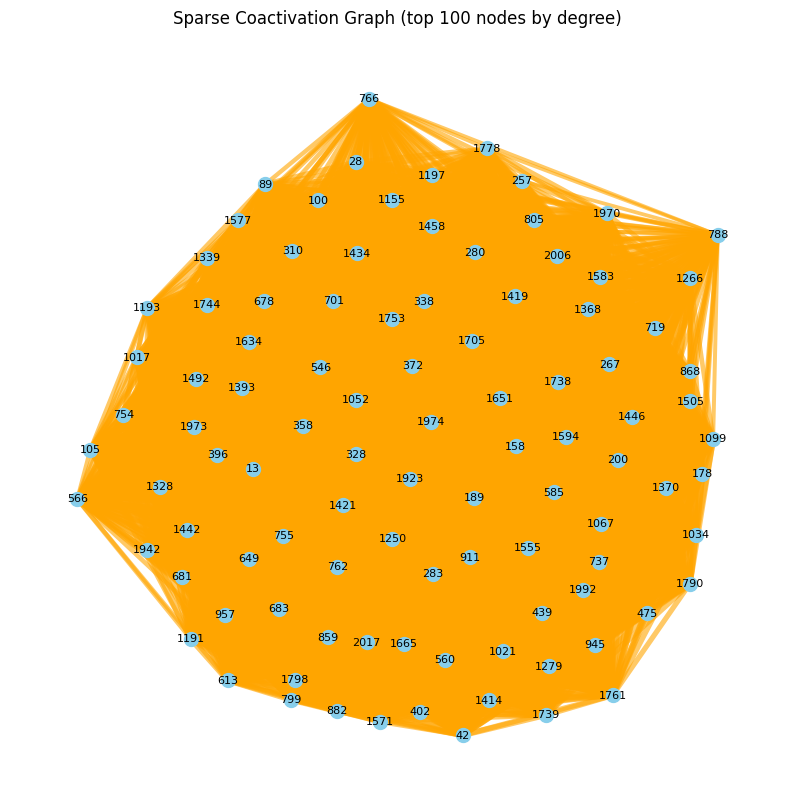

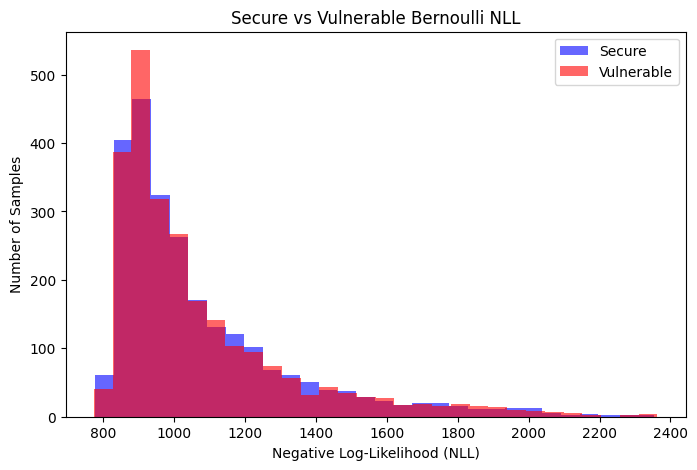

=== AUROC / AUPRC ===
AUROC: 0.4927
AUPRC: 0.4961

=== Summary Statistics ===
Secure NLL mean: 1078.1778
Vulnerable NLL mean: 1073.2177
Difference (Vuln - Secure): -4.9601


In [60]:
import matplotlib.pyplot as plt
import numpy as np

# --- 1️⃣ Sparse Coactivation Graph ---
import networkx as nx

threshold = 0.05
X = (secure_acts[:, :2048] > 1e-6).float()
coactivation = (X.T @ X) / X.shape[0]

G = nx.Graph()
n_features = coactivation.shape[0]
for i in range(n_features):
    for j in range(i + 1, n_features):
        if coactivation[i, j] > threshold:
            G.add_edge(i, j, weight=coactivation[i, j].item())

print(f"Sparse graph nodes: {G.number_of_nodes()}, edges: {G.number_of_edges()}")

# Pick top 100 nodes by degree
top_nodes = sorted(G.degree, key=lambda x: x[1], reverse=True)[:100]
top_node_ids = [n for n, d in top_nodes]
subG = G.subgraph(top_node_ids)

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(subG, seed=42)
edges = subG.edges(data=True)

nx.draw_networkx_nodes(subG, pos, node_size=100, node_color='skyblue')
nx.draw_networkx_edges(
    subG,
    pos,
    edgelist=edges,
    width=[5 * d['weight'] for (_, _, d) in edges],
    alpha=0.6,
    edge_color='orange'
)
nx.draw_networkx_labels(subG, pos, font_size=8)
plt.title("Sparse Coactivation Graph (top 100 nodes by degree)")
plt.axis('off')
plt.show()


# --- 2️⃣ Bernoulli NLL histograms ---
from sklearn.metrics import roc_auc_score, average_precision_score

class SecureBernoulliEstimator:
    def __init__(self, secure_activations, epsilon=1e-6):
        X = (secure_activations > epsilon).float()
        self.p = X.mean(dim=0).clamp(1e-6, 1 - 1e-6)
        self.epsilon = epsilon

    def score_population(self, population):
        X = (population > self.epsilon).float()
        nll = -(X * torch.log(self.p) + (1 - X) * torch.log(1 - self.p)).sum(dim=1)
        return nll.cpu().tolist()


# Truncate to first 2048 features
secure_trunc = secure_acts[:, :2048]
vuln_trunc   = vuln_acts[:, :2048]

estimator = SecureBernoulliEstimator(secure_trunc)

secure_nll = estimator.score_population(secure_trunc)
vuln_nll   = estimator.score_population(vuln_trunc)

# Histogram
plt.figure(figsize=(8, 5))
plt.hist(secure_nll, bins=30, alpha=0.6, label='Secure', color='blue')
plt.hist(vuln_nll, bins=30, alpha=0.6, label='Vulnerable', color='red')
plt.title("Secure vs Vulnerable Bernoulli NLL")
plt.xlabel("Negative Log-Likelihood (NLL)")
plt.ylabel("Number of Samples")
plt.legend()
plt.show()

# --- 3️⃣ AUROC and AUPRC ---
y_true = np.array([0]*len(secure_nll) + [1]*len(vuln_nll))
y_scores = np.array(secure_nll + vuln_nll)

auroc = roc_auc_score(y_true, y_scores)
auprc = average_precision_score(y_true, y_scores)

print("=== AUROC / AUPRC ===")
print(f"AUROC: {auroc:.4f}")
print(f"AUPRC: {auprc:.4f}")

# Summary statistics
print("\n=== Summary Statistics ===")
print(f"Secure NLL mean: {np.mean(secure_nll):.4f}")
print(f"Vulnerable NLL mean: {np.mean(vuln_nll):.4f}")
print(f"Difference (Vuln - Secure): {np.mean(vuln_nll) - np.mean(secure_nll):.4f}")


Focus on Localized Structural Deviations

In [6]:
# Load into cwe_map
cwe_map = load_deltasec_activations(files, max_lines=2500)

cwe = "CWE-79"
secure_subset = cwe_map[cwe].secure
vuln_subset   = cwe_map[cwe].vulnerable

import torch

def edge_surprise_matrix(secure, sample, epsilon=1e-6):
    X_sec = (secure > epsilon).float()
    coact_matrix = (X_sec.T @ X_sec) / X_sec.shape[0]

    X_samp = (sample > epsilon).float()
    sample_matrix = X_samp.unsqueeze(1) * X_samp.unsqueeze(0)

    # Surprise = where sample co-activates but secure rarely does
    surprise = torch.clamp(sample_matrix - coact_matrix, min=0)
    return surprise


def sample_surprise_score(secure, sample, epsilon=1e-6):
    surprise = edge_surprise_matrix(secure, sample, epsilon)
    # Count "rare but violent" violations
    return (surprise > 0).float().sum() / (sample.shape[0]*(sample.shape[0]-1)/2)

scores = [sample_surprise_score(secure_subset, s) for s in vuln_subset]
print(f"Average structural surprise (CWE {cwe}): {torch.tensor(scores).mean():.4f}")


2026-02-23 03:14:18 [info     ] Processing DeltaSec file       file=../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl


Loading ../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl: 2493it [00:10, 248.08it/s]


KeyboardInterrupt: 

In [6]:
cwe_map = load_deltasec_activations(files, max_lines=2500)

2026-02-26 17:41:21 [info     ] Processing DeltaSec file       file=../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl


Loading ../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl: 2493it [00:12, 192.20it/s]


In [10]:
# Load into cwe_map
cwe_map = load_deltasec_activations(files, max_lines=2500)

# cwe = "CWE-79"
# secure_subset = cwe_map[cwe].secure
# vuln_subset   = cwe_map[cwe].vulnerable

2026-02-24 00:03:52 [info     ] Processing DeltaSec file       file=../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl


Loading ../../artifacts/activations/run_20260218_134529_vulnerable_code_qwen_coder_standard_16384_10M/activations_layer_11_sae_blocks.11.hook_resid_post_component_hook_resid_post.hook_sae_acts_post.jsonl: 2493it [00:23, 104.61it/s]


In [7]:
import torch
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
from sklearn.metrics import roc_auc_score
from sklearn.cluster import SpectralClustering
from tqdm import tqdm

epsilon = 1e-6
top_k_edges = 200
n_permutations = 50

def compute_coactivation(X):
    X_bin = (X > epsilon).float()
    return (X_bin.T @ X_bin) / X_bin.shape[0]

def compute_edge_surprise(secure, samples):
    coact_sec = compute_coactivation(secure)
    X_samp = (samples > epsilon).float()
    outer = X_samp.unsqueeze(2) * X_samp.unsqueeze(1)
    surprise = torch.clamp(outer - coact_sec.unsqueeze(0), min=0)
    mean_edge = surprise.mean(0)
    return mean_edge

def permutation_significance(secure, vuln, n_perm=50):
    coact_sec = compute_coactivation(secure)
    real = compute_coactivation(vuln) - coact_sec
    real = real.abs()

    count = torch.zeros_like(real)

    for _ in range(n_perm):
        perm = torch.randperm(len(vuln))
        fake = secure[perm]
        fake_shift = (compute_coactivation(fake) - coact_sec).abs()
        count += (fake_shift >= real).float()

    pvals = (count + 1) / (n_perm + 1)
    return pvals

def spectral_stats(matrix):
    eigvals = torch.linalg.eigvalsh(matrix)
    eigvals = torch.sort(eigvals, descending=True).values
    return eigvals[0].item(), eigvals[1].item()

def analyze_cwe(cwe, secure, vuln):

    print(f"\n===== {cwe} =====")

    coact_sec = compute_coactivation(secure)
    coact_vuln = compute_coactivation(vuln)

    edge_shift = (coact_vuln - coact_sec).abs()

    # --- Global stats ---
    mean_surprise = edge_shift.mean().item()
    std_surprise = edge_shift.std().item()
    frac_nonzero = (edge_shift > 0).float().mean().item()

    # --- Concentration ---
    flat = edge_shift.flatten()
    top1 = torch.topk(flat, int(0.01*len(flat))).values.mean().item()
    concentration_ratio = top1 / mean_surprise

    # --- Spectral ---
    lambda1, lambda2 = spectral_stats(edge_shift)

    # --- Permutation ---
    pvals = permutation_significance(secure, vuln, n_permutations)
    frac_sig = (pvals < 0.01).float().mean().item()

    # --- Sparse Graph ---
    G = nx.Graph()
    n_features = edge_shift.shape[0]
    triu = torch.triu_indices(n_features, n_features, offset=1)
    weights = edge_shift[triu[0], triu[1]]
    top_idx = torch.topk(weights, min(top_k_edges, len(weights))).indices

    for idx in top_idx:
        i = triu[0][idx].item()
        j = triu[1][idx].item()
        G.add_edge(i, j, weight=weights[idx].item())

    n_components = nx.number_connected_components(G)

    # --- Spectral clustering ---
    # clustering = SpectralClustering(
    #     n_clusters=5,
    #     affinity="precomputed"
    # ).fit(edge_shift.numpy())

    # modularity = nx.algorithms.community.modularity(
    #     G,
    #     [set(np.where(clustering.labels_ == i)[0]) for i in range(5)]
    # )
    # --- Spectral clustering on subgraph only ---
    nodes = list(G.nodes())

    if len(nodes) > 5:  # need enough nodes
        submatrix = edge_shift[nodes][:, nodes].numpy()

        clustering = SpectralClustering(
            n_clusters=min(5, len(nodes)//2),
            affinity="precomputed"
        ).fit(submatrix)

        communities = []
        for i in range(max(clustering.labels_) + 1):
            cluster_nodes = [nodes[idx] for idx in np.where(clustering.labels_ == i)[0]]
            communities.append(set(cluster_nodes))

        modularity = nx.algorithms.community.modularity(G, communities)
    else:
        modularity = 0
        
    # --- Heatmap ---
    plt.figure(figsize=(6,5))
    plt.imshow(edge_shift.numpy(), cmap="hot")
    plt.title(f"{cwe} Edge Shift Heatmap")
    plt.colorbar()
    plt.show()

    # --- Graph ---
    plt.figure(figsize=(6,6))
    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, node_size=50)
    plt.title(f"{cwe} Top Structural Edges")
    plt.show()

    return {
        "CWE": cwe,
        "MeanSurprise": mean_surprise,
        "StdSurprise": std_surprise,
        "FracNonZero": frac_nonzero,
        "Top1%Ratio": concentration_ratio,
        "Lambda1": lambda1,
        "Lambda1/Lambda2": lambda1 / (lambda2 + 1e-8),
        "FracSignificantEdges": frac_sig,
        "ConnectedComponents": n_components,
        "Modularity": modularity
    }

In [15]:
len(cwe_map)
list(cwe_map.keys())

['CWE-200',
 'CWE-400',
 'CWE-125',
 'CWE-416',
 'CWE-89',
 'CWE-20',
 'CWE-369',
 'CWE-78',
 'CWE-190',
 'CWE-79',
 'CWE-787',
 'CWE-352',
 'CWE-22',
 'CWE-94',
 'CWE-362',
 'CWE-287',
 'CWE-120',
 'CWE-476',
 'CWE-434',
 'CWE-401',
 'CWE-119',
 'CWE-415',
 'CWE-189',
 'CWE-264',
 'CWE-399']

In [13]:
cwe_map

AttributeError: 'dict' object has no attribute 'shape'


===== CWE-200 =====


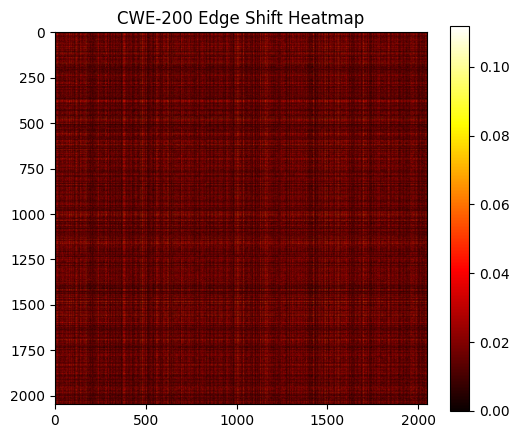

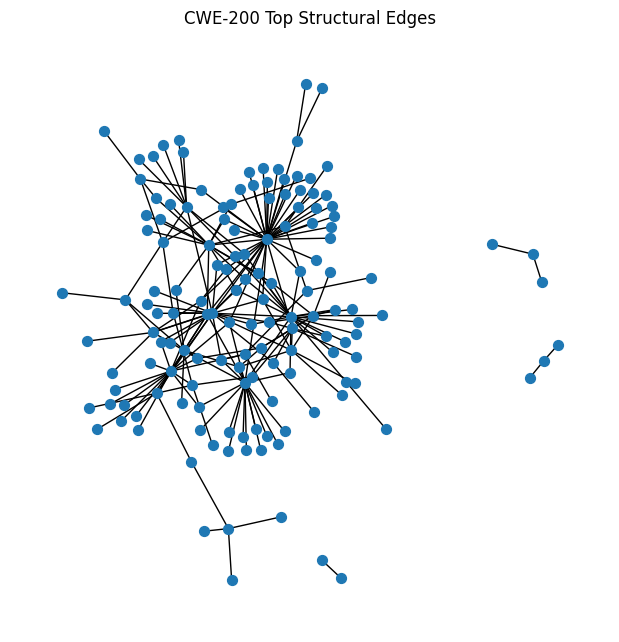


===== CWE-400 =====


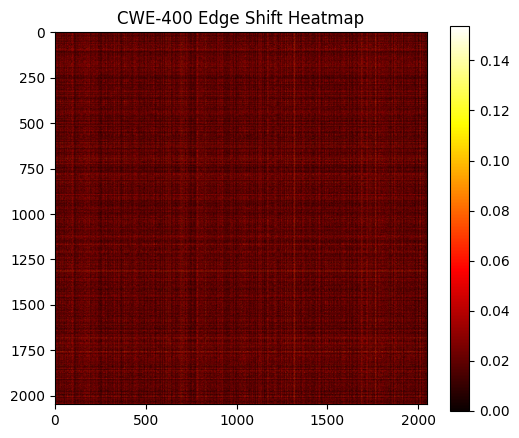

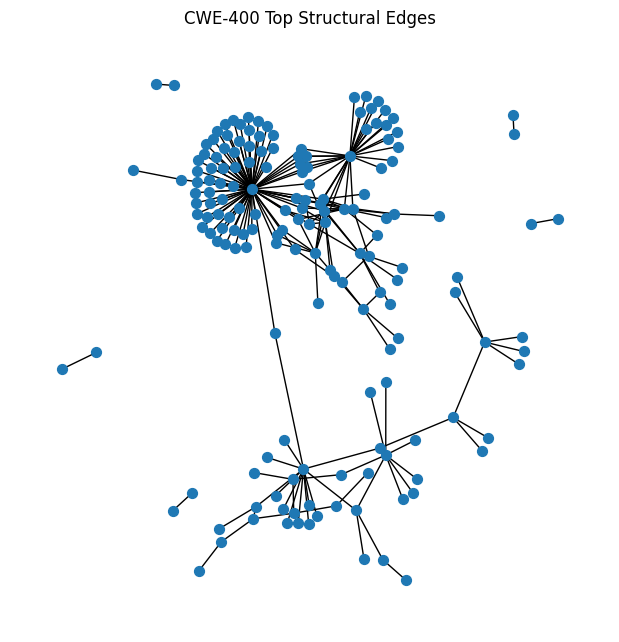


===== CWE-125 =====


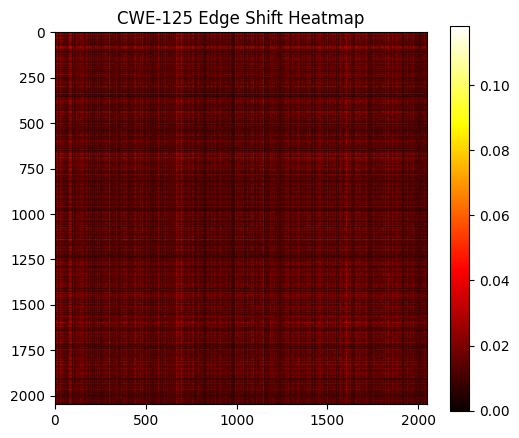

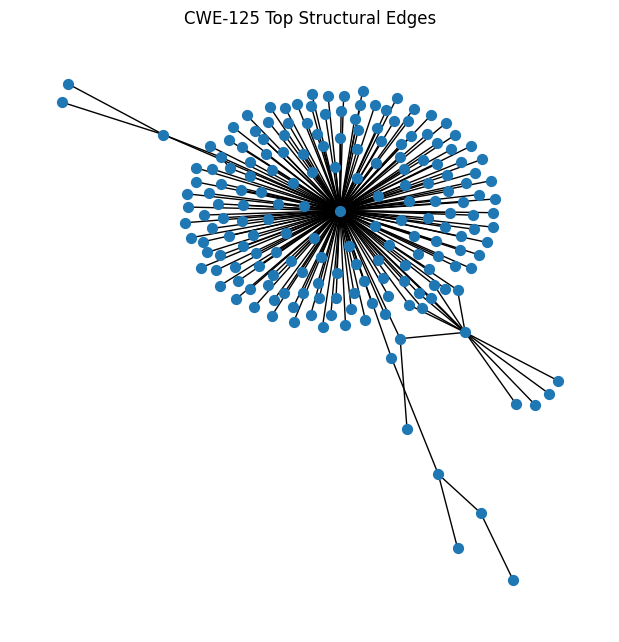


===== CWE-416 =====


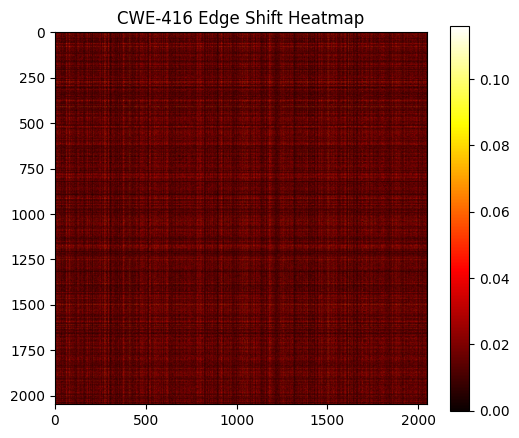

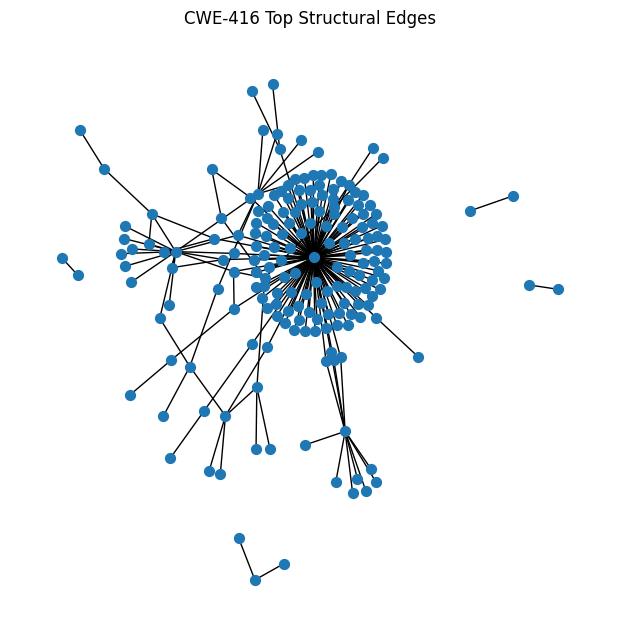


===== CWE-89 =====


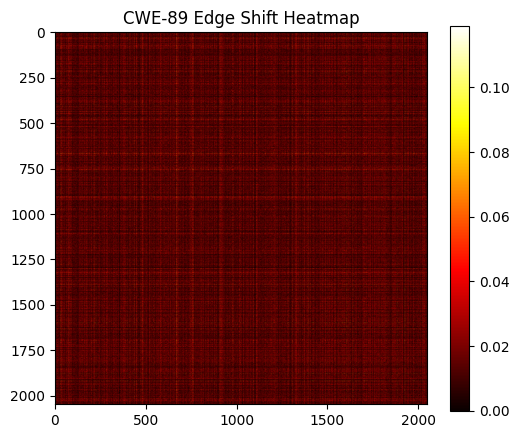

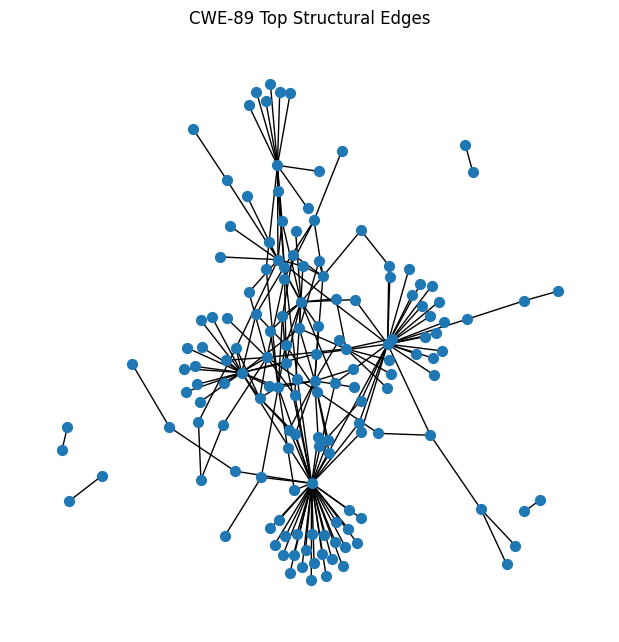


===== CWE-20 =====


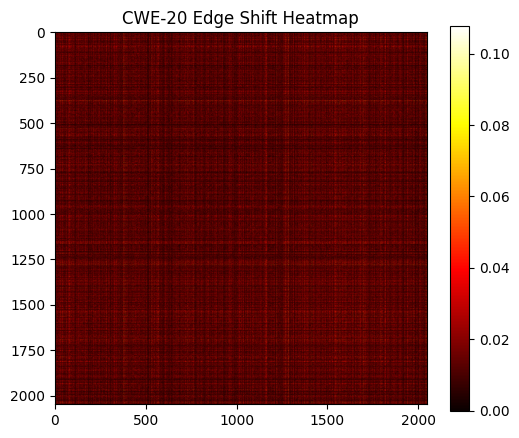

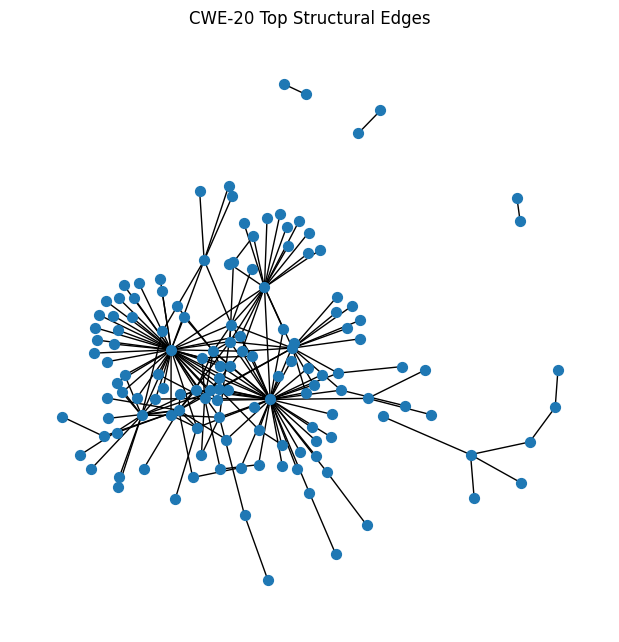


===== CWE-369 =====


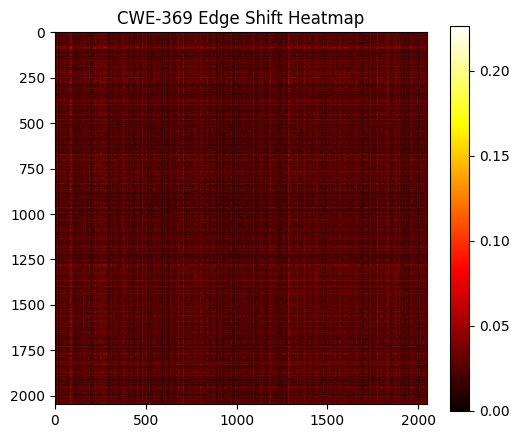

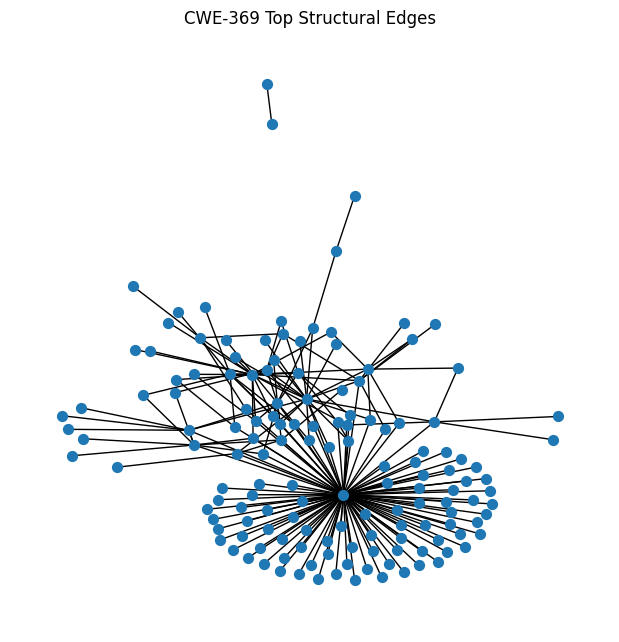


===== CWE-78 =====


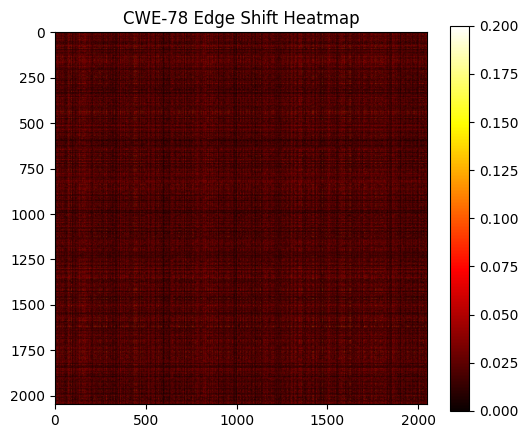

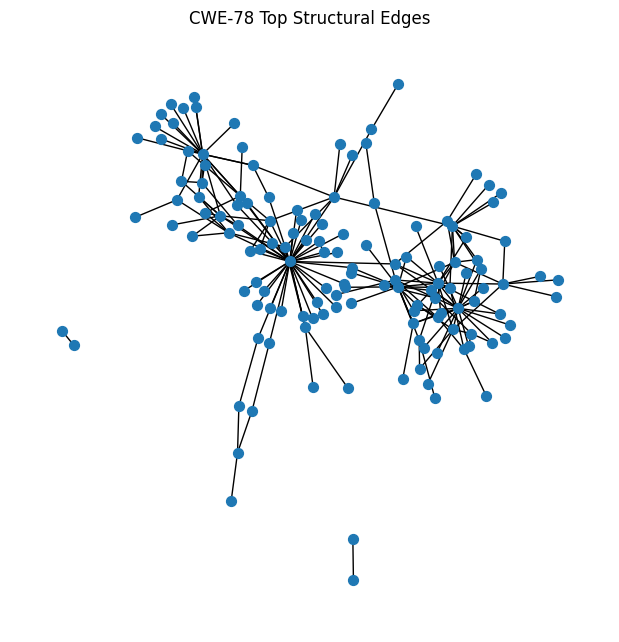


===== CWE-190 =====


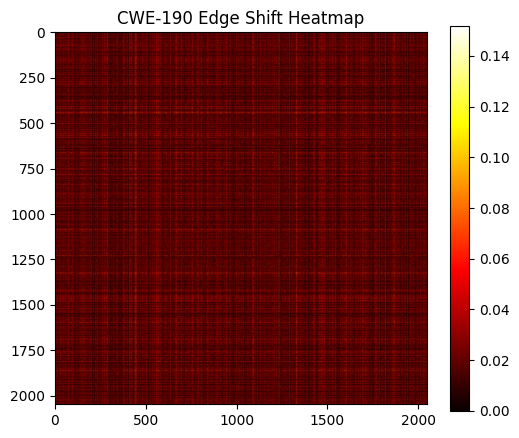

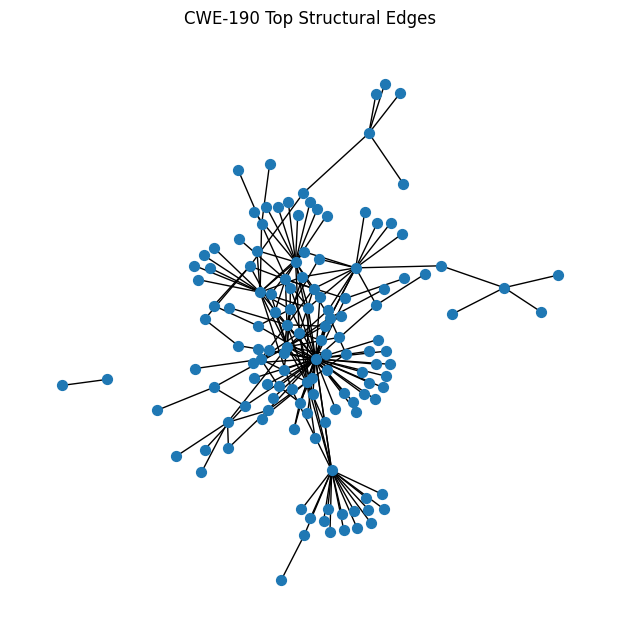


===== CWE-79 =====


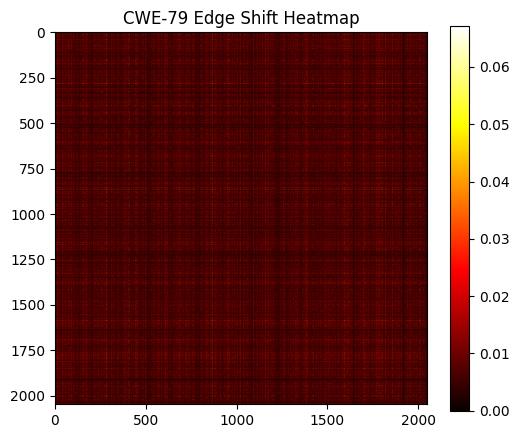

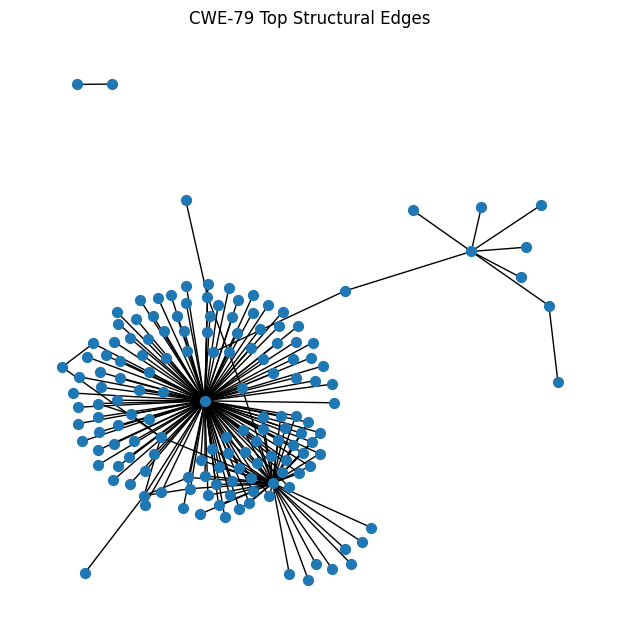


===== CWE-787 =====


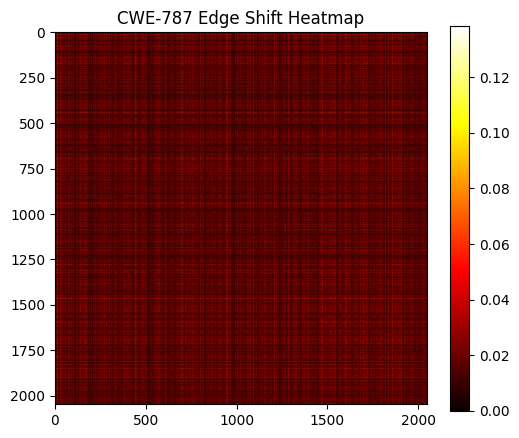

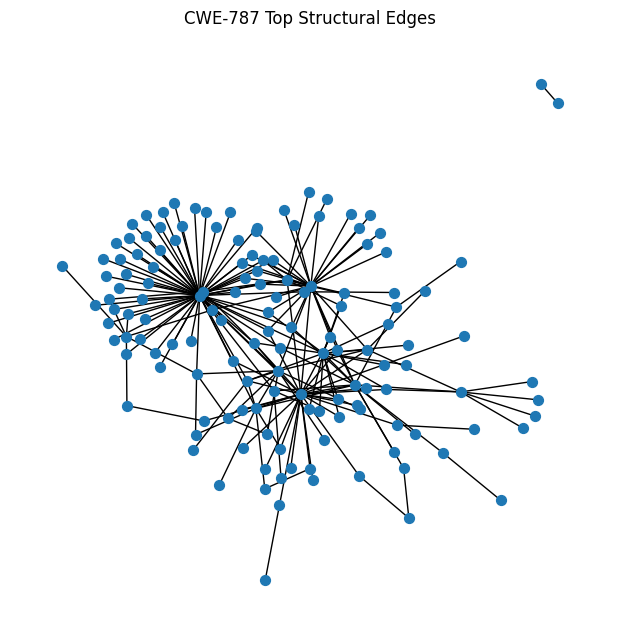


===== CWE-352 =====


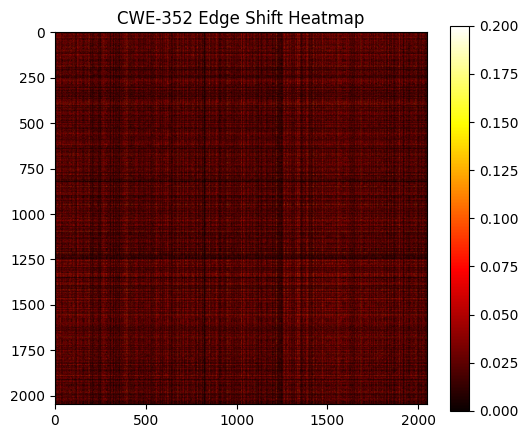

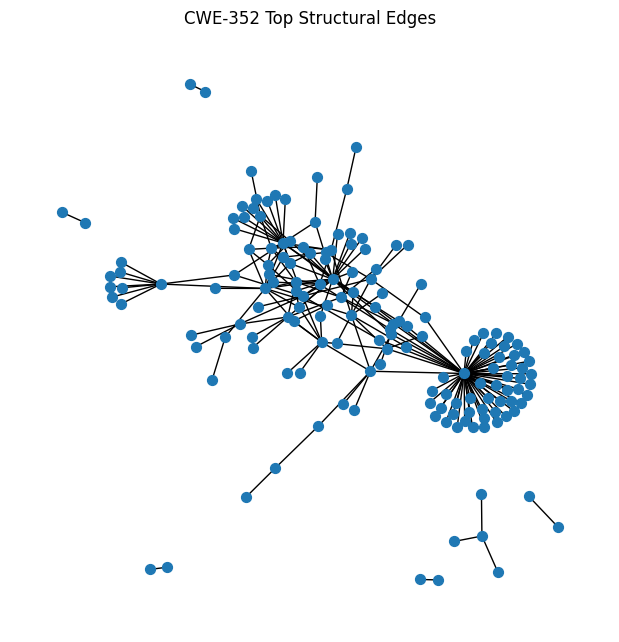


===== CWE-22 =====


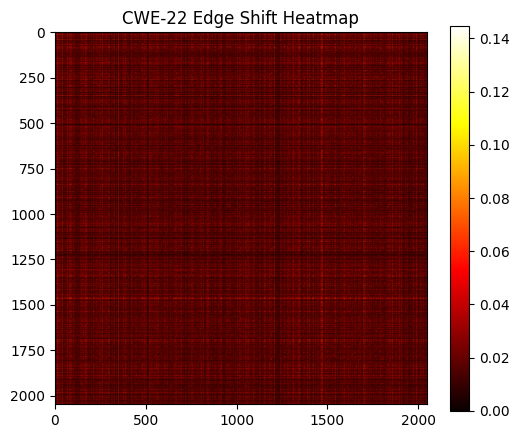

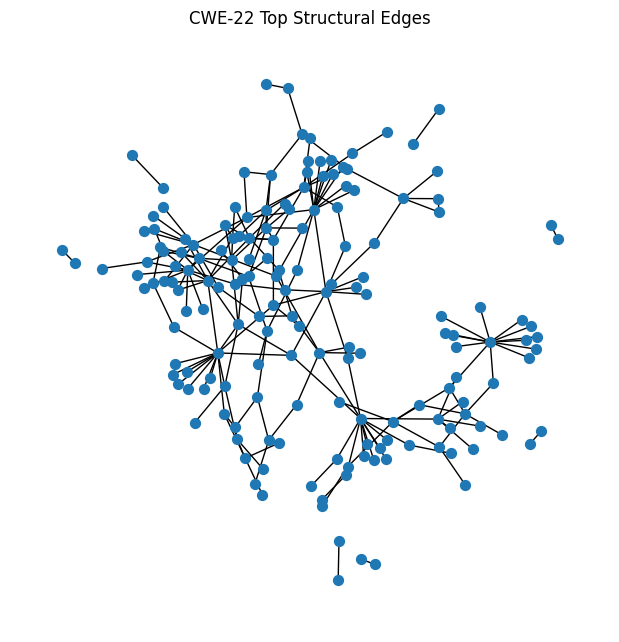


===== CWE-94 =====


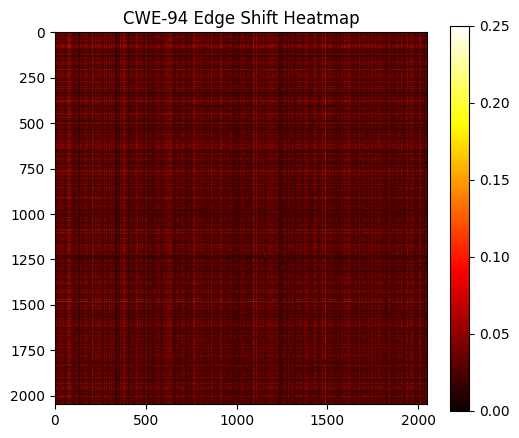

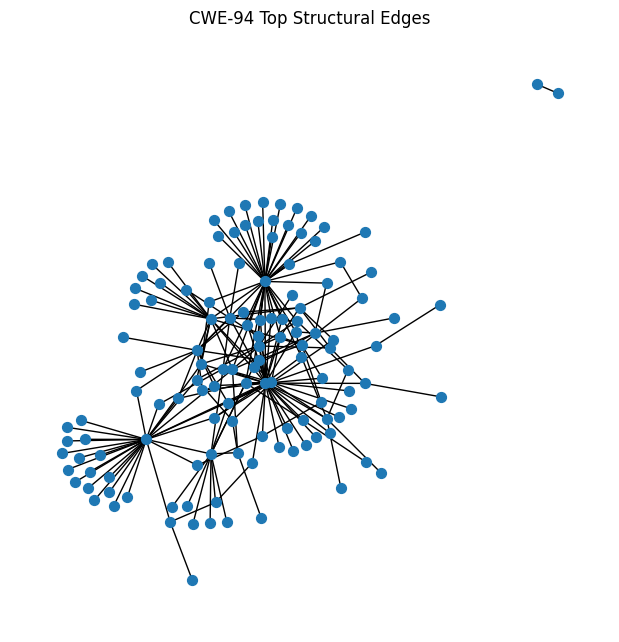


===== CWE-362 =====


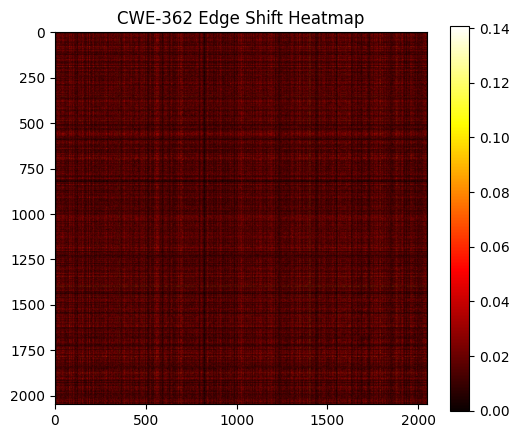

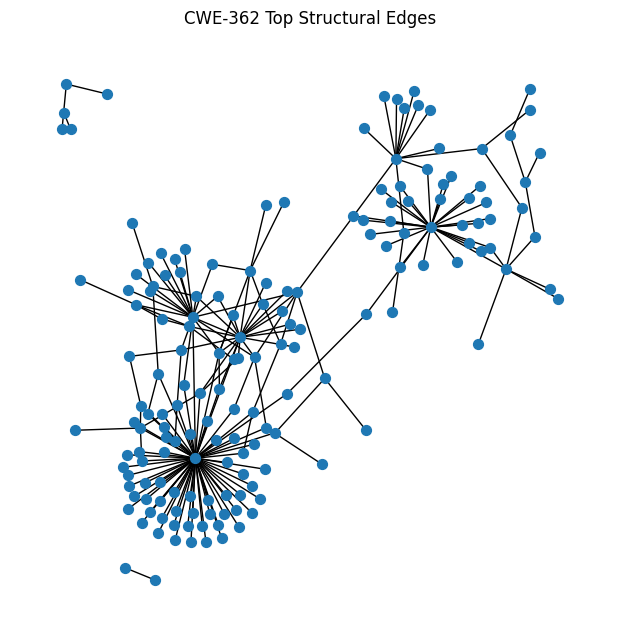


===== CWE-287 =====


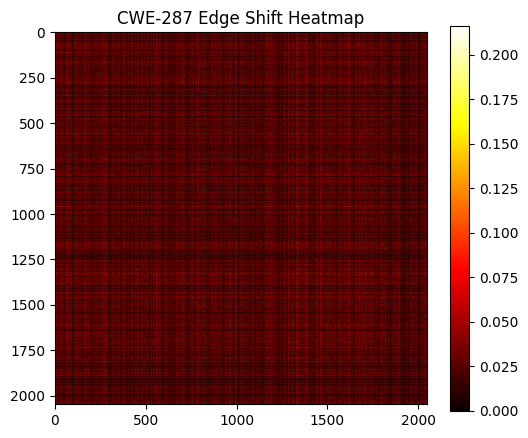

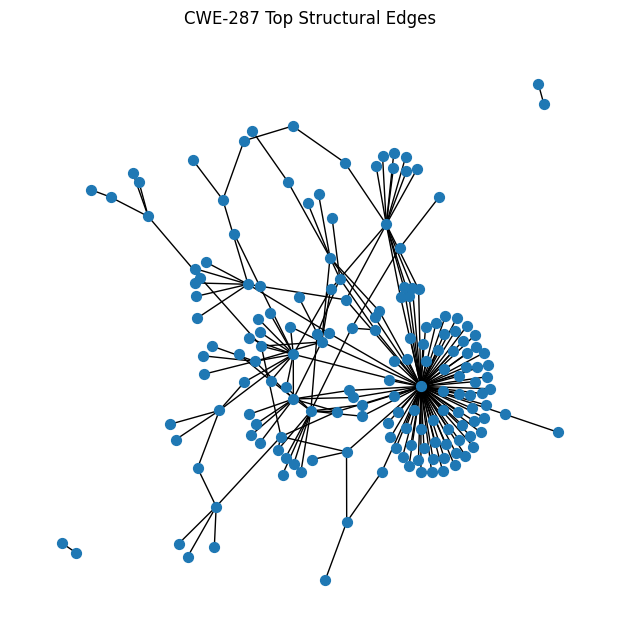


===== CWE-120 =====


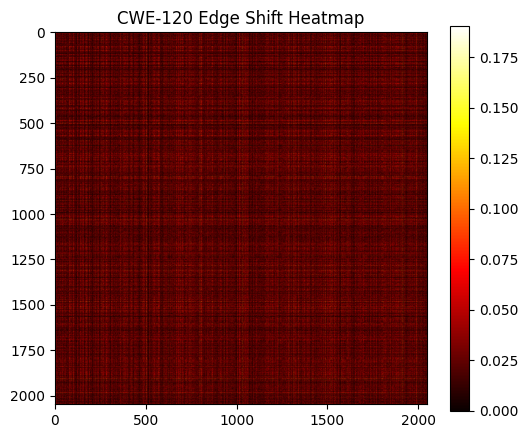

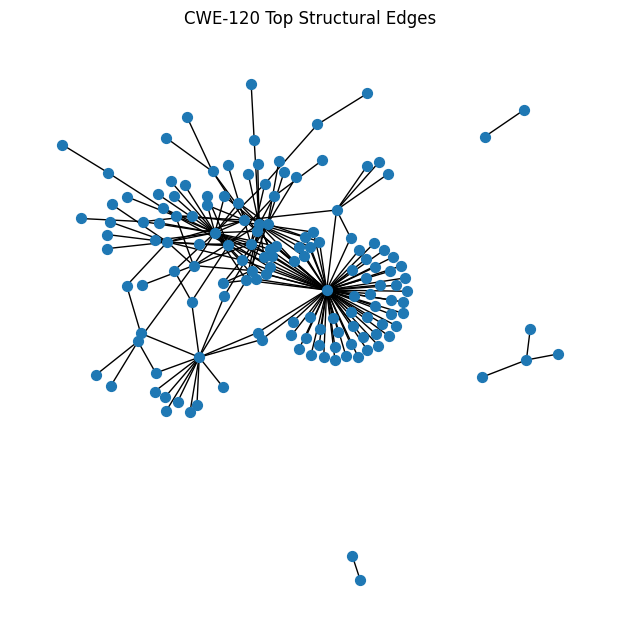


===== CWE-476 =====


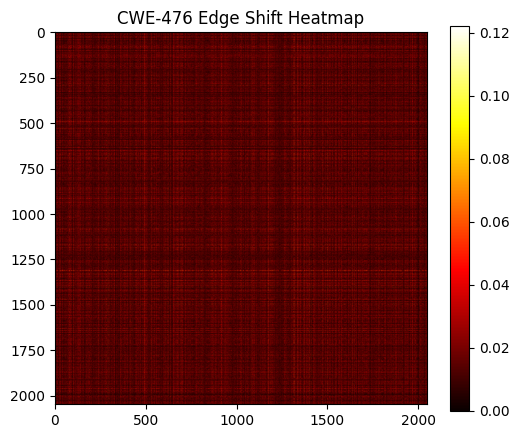

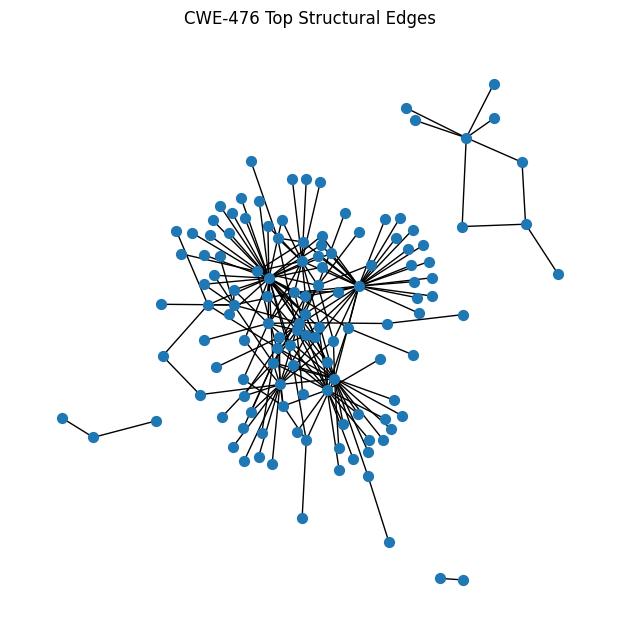


===== CWE-434 =====


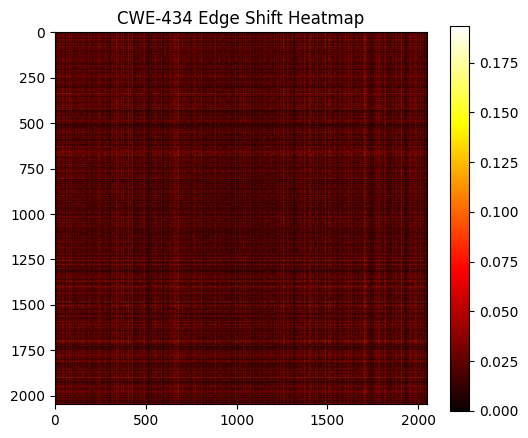

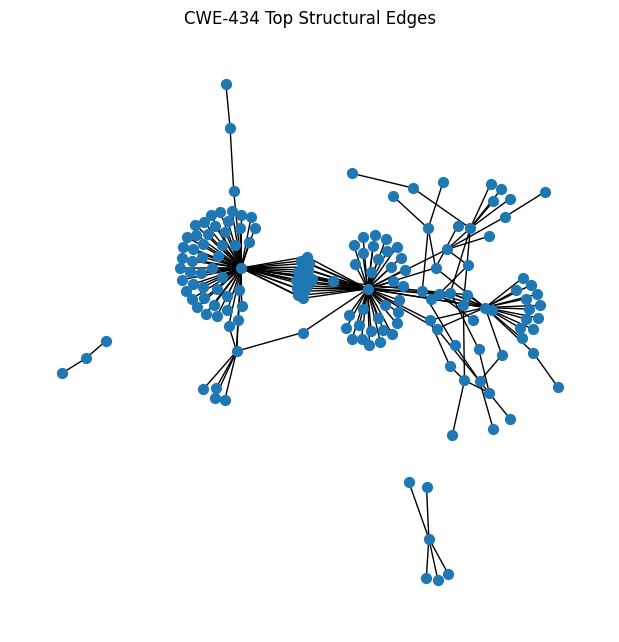


===== CWE-401 =====


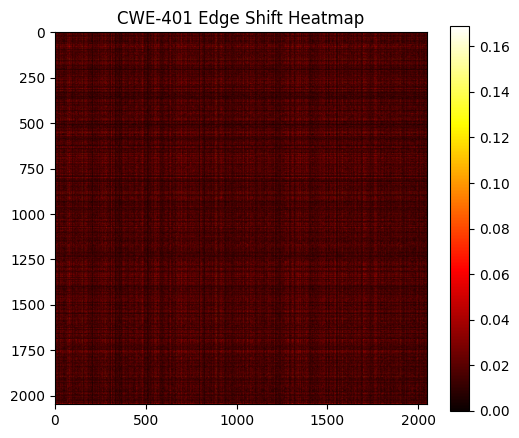

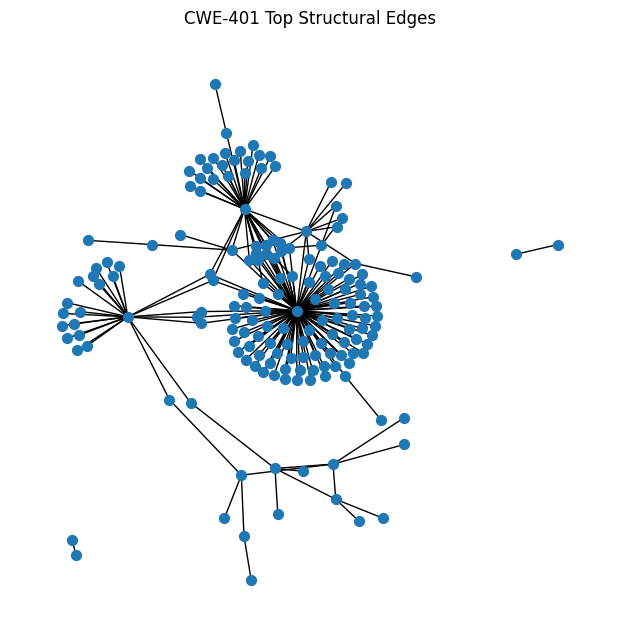


===== CWE-119 =====


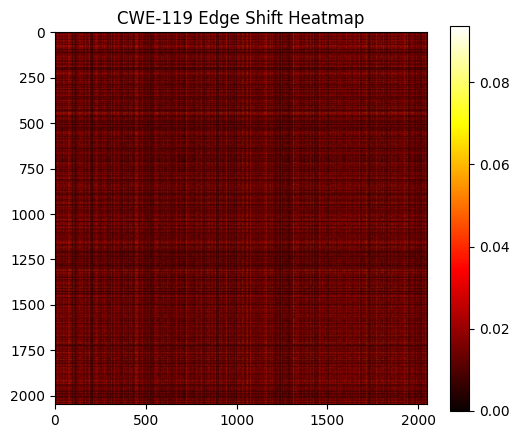

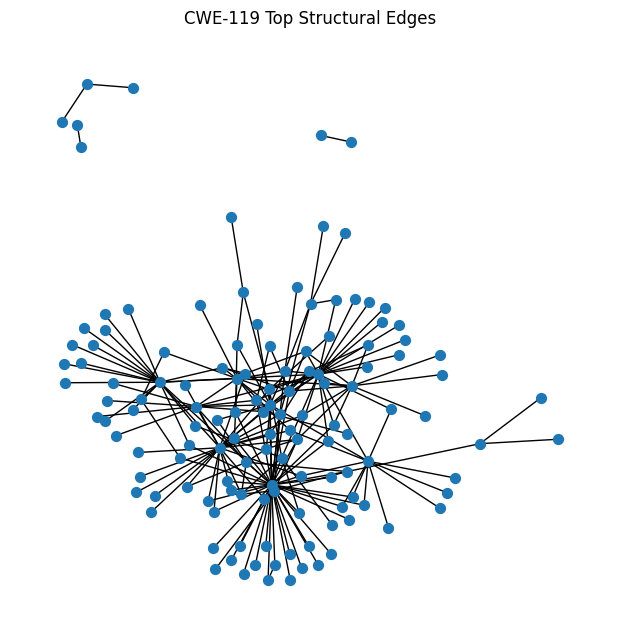


===== CWE-415 =====


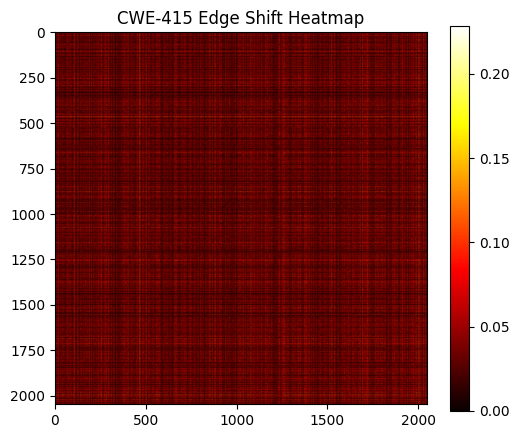

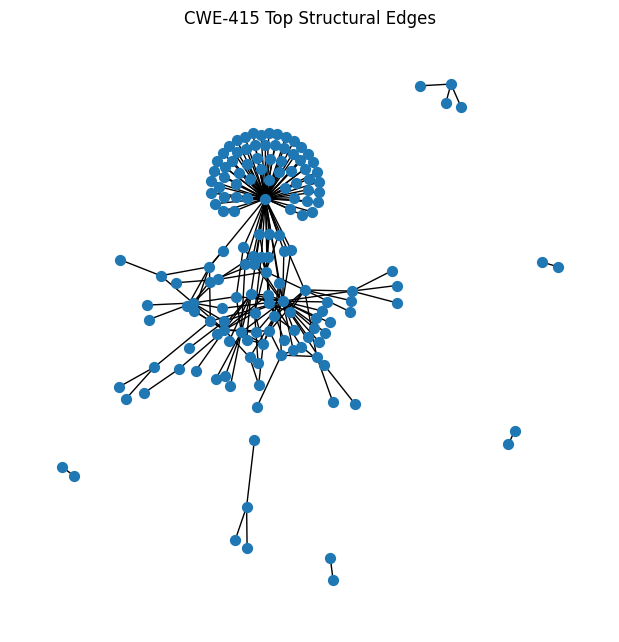


===== CWE-189 =====


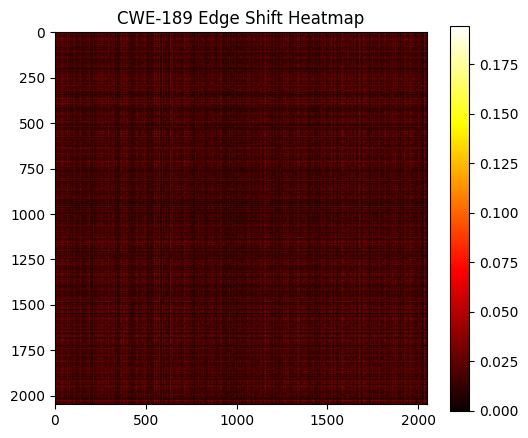

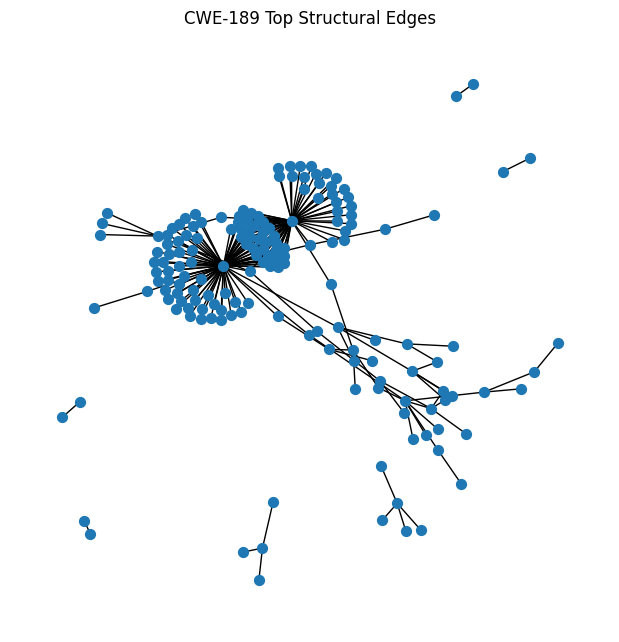


===== CWE-264 =====


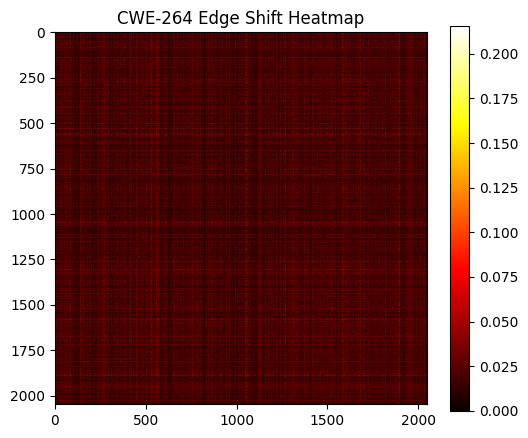

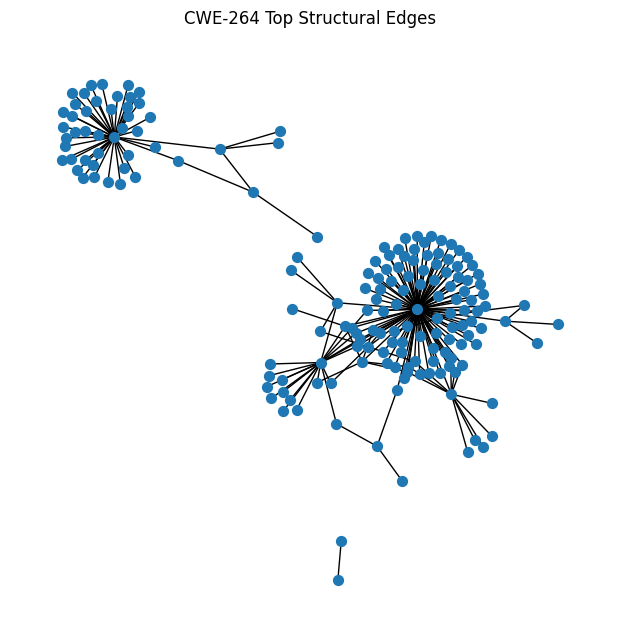


===== CWE-399 =====


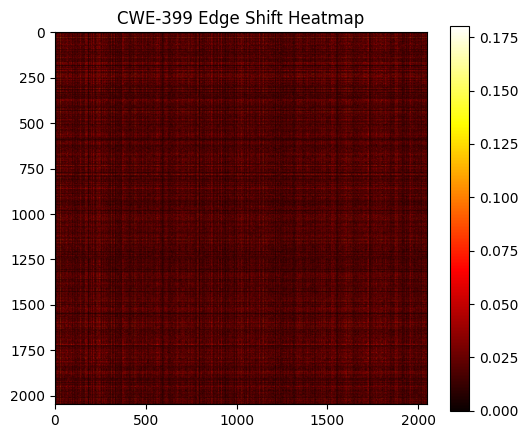

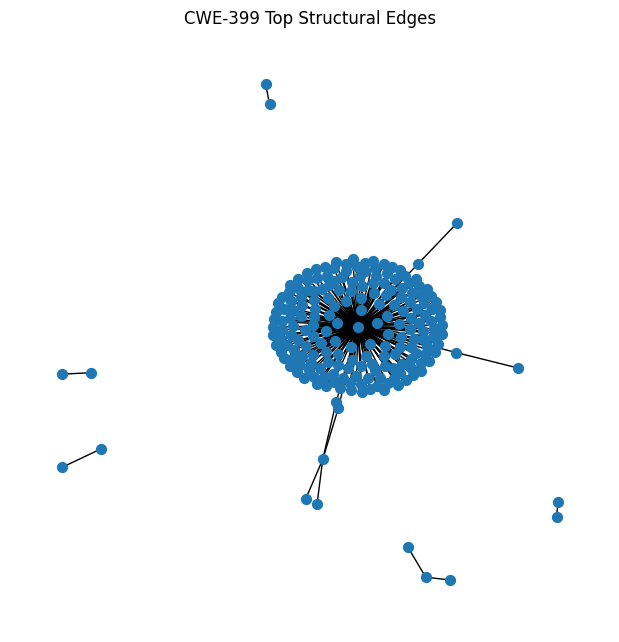

        CWE  MeanSurprise  StdSurprise  FracNonZero  Top1%Ratio    Lambda1  \
7    CWE-78      0.020061     0.020291     0.611785    5.216736  47.742687   
22  CWE-189      0.016927     0.019930     0.491292    5.303683  43.147591   
1   CWE-400      0.019959     0.017288     0.750217    4.188794  45.643055   
17  CWE-476      0.013882     0.011851     0.860149    4.353677  32.400383   
23  CWE-264      0.019621     0.019854     0.639556    4.736672  47.414593   
16  CWE-120      0.022625     0.022741     0.636829    4.740930  55.790611   
14  CWE-362      0.014647     0.014634     0.654198    4.712765  35.511784   
5    CWE-20      0.012415     0.010985     0.823852    4.468212  29.101658   
19  CWE-401      0.015865     0.015955     0.665161    4.839913  38.587067   
18  CWE-434      0.021055     0.024228     0.510105    5.036482  53.506680   
9    CWE-79      0.006533     0.006215     0.841727    5.140218  15.745422   
12   CWE-22      0.017019     0.015893     0.722741    4.448853 

In [16]:
cwes_to_test = cwe_map.keys()  # test all

rows = []

for cwe in cwes_to_test:
    secure = cwe_map[cwe].secure[:, :2048]
    vuln   = cwe_map[cwe].vulnerable[:, :2048]

    stats = analyze_cwe(cwe, secure, vuln)
    rows.append(stats)

df = pd.DataFrame(rows)
print(df.sort_values("Lambda1/Lambda2"))

In [17]:
df

,CWE,MeanSurprise,StdSurprise,FracNonZero,Top1%Ratio,Lambda1,Lambda1/Lambda2,FracSignificantEdges,ConnectedComponents,Modularity
0,CWE-200,0.015083,0.013216,0.826359,4.285252,36.326542,6.260866,0.0,4,0.121173
1,CWE-400,0.019959,0.017288,0.750217,4.188794,45.643055,4.026421,0.0,6,0.156845
2,CWE-125,0.014243,0.012210,0.880960,4.212669,35.023750,8.989330,0.0,1,-0.055913
3,CWE-416,0.014763,0.012938,0.787774,4.276243,34.896637,6.783570,0.0,5,-0.017554
4,CWE-89,0.013534,0.013099,0.688228,4.793987,32.385117,5.065343,0.0,5,0.254493
5,CWE-20,0.012415,0.010985,0.823852,4.468212,29.101658,4.781966,0.0,5,0.203290
6,CWE-369,0.025081,0.024169,0.714521,4.808707,62.081467,5.810853,0.0,2,-0.031670
7,CWE-78,0.020061,0.020291,0.611785,5.216736,47.742687,3.734562,0.0,3,0.269123
8,CWE-190,0.018013,0.016500,0.746514,4.465445,43.141571,5.331898,0.0,2,0.178337
9,CWE-79,0.006533,0.006215,0.841727,5.140218,15.745422,4.842450,0.0,3,0.015025


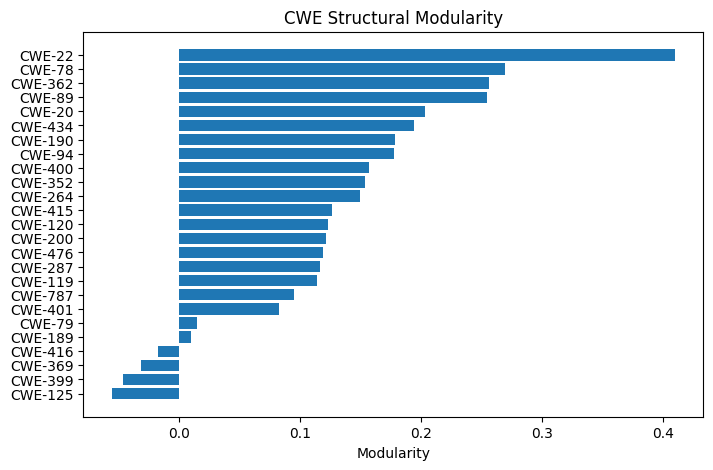

In [18]:
df_sorted = df.sort_values("Modularity", ascending=False)

plt.figure(figsize=(8,5))
plt.barh(df_sorted["CWE"], df_sorted["Modularity"])
plt.title("CWE Structural Modularity")
plt.xlabel("Modularity")
plt.gca().invert_yaxis()
plt.show()

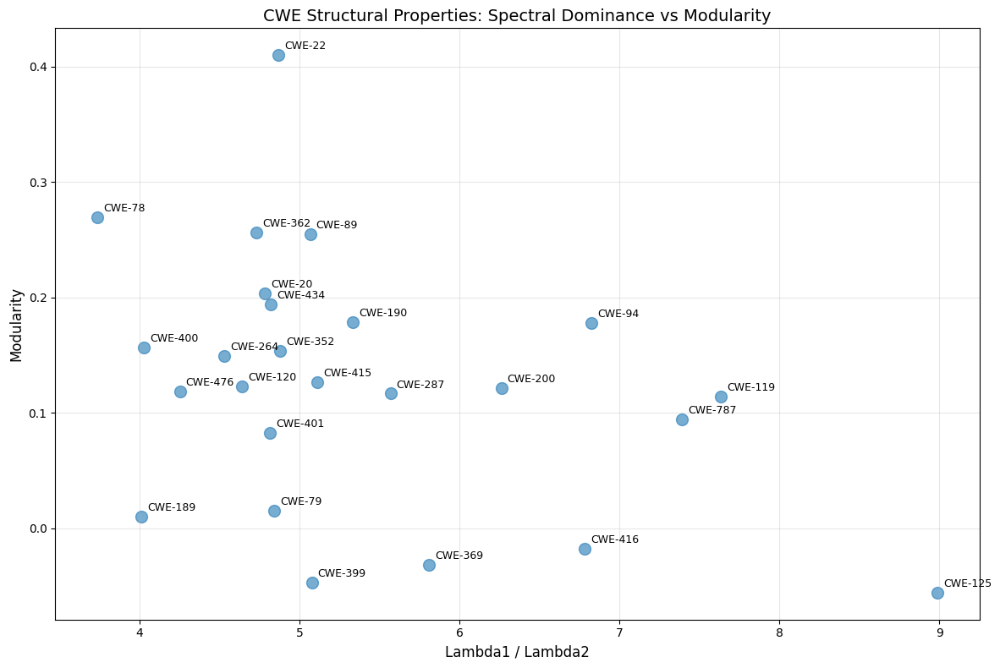

In [27]:
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
plt.scatter(df["Lambda1/Lambda2"], df["Modularity"], s=100, alpha=0.6)

# Add CWE labels to each point
for idx, row in df.iterrows():
    plt.annotate(
        row["CWE"],
        (row["Lambda1/Lambda2"], row["Modularity"]),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=9,
        ha="left"
    )

plt.xlabel("Lambda1 / Lambda2", fontsize=12)
plt.ylabel("Modularity", fontsize=12)
plt.title("CWE Structural Properties: Spectral Dominance vs Modularity", fontsize=14)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [8]:
from sklearn.metrics.pairwise import cosine_similarity

def flatten_upper(matrix):
    triu = torch.triu_indices(matrix.shape[0], matrix.shape[1], offset=1)
    return matrix[triu[0], triu[1]].numpy()

edge_vectors = {}
for cwe in cwe_map:
    secure = cwe_map[cwe].secure[:, :2048]
    vuln   = cwe_map[cwe].vulnerable[:, :2048]

    coact_sec = compute_coactivation(secure)
    coact_vuln = compute_coactivation(vuln)
    edge_shift = (coact_vuln - coact_sec)

    edge_vectors[cwe] = flatten_upper(edge_shift)

cwes = list(edge_vectors.keys())
X = np.stack([edge_vectors[cwe] for cwe in cwes])

similarity_matrix = cosine_similarity(X)

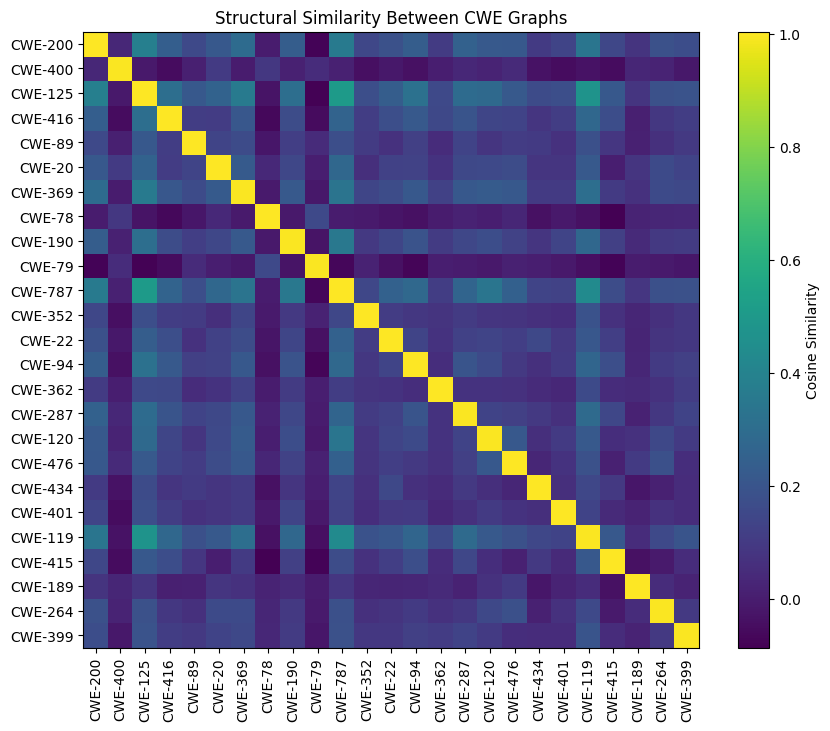

      CWE1     CWE2  CosineSimilarity
0  CWE-787  CWE-125          0.505703
1  CWE-125  CWE-787          0.505703
2  CWE-119  CWE-125          0.473529
3  CWE-125  CWE-119          0.473529
4  CWE-787  CWE-119          0.436840
5  CWE-119  CWE-787          0.436840
6  CWE-200  CWE-125          0.385438
7  CWE-125  CWE-200          0.385438
8  CWE-369  CWE-125          0.363252
9  CWE-125  CWE-369          0.363252


In [38]:
plt.figure(figsize=(10,8))
plt.imshow(similarity_matrix, cmap="viridis")
plt.colorbar(label="Cosine Similarity")
plt.xticks(range(len(cwes)), cwes, rotation=90)
plt.yticks(range(len(cwes)), cwes)
plt.title("Structural Similarity Between CWE Graphs")
plt.show()

# create table of top 10 most similar CWEs based on cosine similarity
similarity_df = pd.DataFrame(similarity_matrix, index=cwes, columns=cwes)
similarity_df = similarity_df.where(~np.eye(similarity_df.shape[0], dtype=bool))  # set diagonal to NaN
similarity_df = similarity_df.unstack().dropna().sort_values(ascending=False).reset_index()
similarity_df.columns = ["CWE1", "CWE2", "CosineSimilarity"]
print(similarity_df.head(10))

In [14]:
# create table of top 10 most similar CWEs based on cosine similarity
similarity_df = pd.DataFrame(similarity_matrix, index=cwes, columns=cwes)
similarity_df = similarity_df.where(~np.eye(similarity_df.shape[0], dtype=bool))  # set diagonal to NaN
similarity_df = similarity_df.unstack().dropna().sort_values(ascending=False).reset_index()
similarity_df.columns = ["CWE1", "CWE2", "CosineSimilarity"]
print(similarity_df.head(50))

       CWE1     CWE2  CosineSimilarity
0   CWE-787  CWE-125          0.505703
1   CWE-125  CWE-787          0.505703
2   CWE-119  CWE-125          0.473529
3   CWE-125  CWE-119          0.473529
4   CWE-787  CWE-119          0.436840
5   CWE-119  CWE-787          0.436840
6   CWE-200  CWE-125          0.385438
7   CWE-125  CWE-200          0.385438
8   CWE-369  CWE-125          0.363252
9   CWE-125  CWE-369          0.363252
10  CWE-787  CWE-200          0.357615
11  CWE-200  CWE-787          0.357615
12  CWE-190  CWE-787          0.349590
13  CWE-787  CWE-190          0.349590
14  CWE-120  CWE-787          0.336974
15  CWE-787  CWE-120          0.336974
16  CWE-200  CWE-119          0.335506
17  CWE-119  CWE-200          0.335506
18  CWE-369  CWE-787          0.333319
19  CWE-787  CWE-369          0.333319
20   CWE-94  CWE-125          0.318670
21  CWE-125   CWE-94          0.318670
22  CWE-190  CWE-125          0.308822
23  CWE-125  CWE-190          0.308822
24  CWE-369  CWE-119     

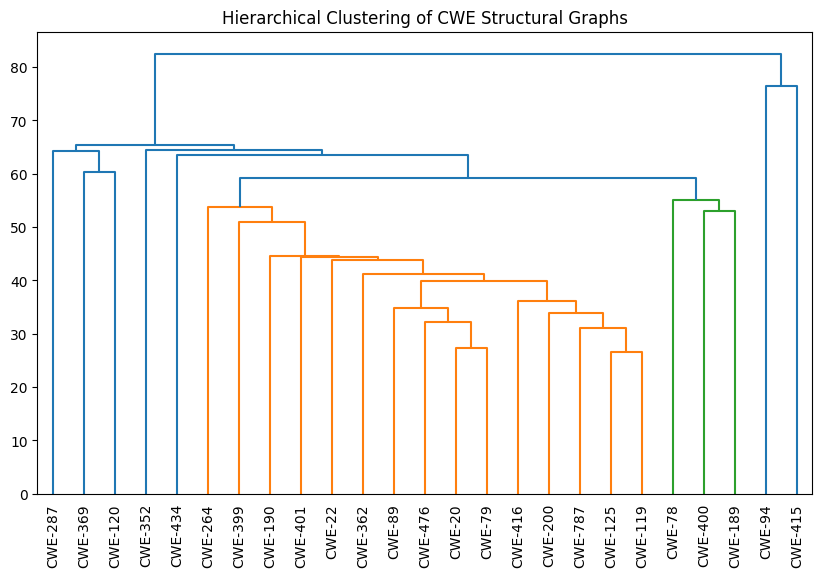

In [40]:
import scipy.cluster.hierarchy as sch

linkage = sch.linkage(X, method="ward")

plt.figure(figsize=(10,6))
sch.dendrogram(linkage, labels=cwes, leaf_rotation=90)
plt.title("Hierarchical Clustering of CWE Structural Graphs")
plt.show()

In [41]:
# Average off-diagonal similarity
off_diag = similarity_matrix[~np.eye(len(cwes),dtype=bool)]
print("Mean cross-CWE similarity:", off_diag.mean()) 

Mean cross-CWE similarity: 0.10936536


In [11]:
cwe_vectors: Dict[str, np.ndarray]  
# Each CWE mapped to its structural vector (flattened graph / spectral vector etc.)

cwe_labels: List[str]  
# List of CWEs corresponding to vectors (same order)

cwe_to_family: Dict[str, str]
# e.g. {"CWE-787": "memory", "CWE-125": "memory", ...}

In [22]:
import numpy as np
from itertools import combinations
from sklearn.metrics.pairwise import cosine_similarity
from tqdm import trange


def compute_mean_cross_similarity(vectors):
    sims = cosine_similarity(vectors)
    n = sims.shape[0]

    values = []
    for i in range(n):
        for j in range(i+1, n):
            values.append(sims[i, j])

    return np.mean(values)


def permutation_test_cross_similarity(cwe_vectors, n_perm=1000):
    cwes = list(cwe_vectors.keys())
    vectors = np.stack([cwe_vectors[cwe] for cwe in cwes])

    observed = compute_mean_cross_similarity(vectors)

    perm_stats = []

    for _ in trange(n_perm):
        permuted = np.random.permutation(vectors)
        stat = compute_mean_cross_similarity(permuted)
        perm_stats.append(stat)

    perm_stats = np.array(perm_stats)

    p_value = (perm_stats <= observed).mean()  # lower similarity = more separation

    return observed, perm_stats.mean(), p_value

In [23]:
def compute_group_similarity(group_vectors):
    sims = cosine_similarity(group_vectors)
    n = sims.shape[0]

    values = []
    for i in range(n):
        for j in range(i+1, n):
            values.append(sims[i, j])

    return np.mean(values)


def permutation_test_family_cohesion(cwe_vectors, family_cwes, n_perm=5000):
    cwes = list(cwe_vectors.keys())
    vectors = np.stack([cwe_vectors[cwe] for cwe in cwes])

    family_indices = [cwes.index(cwe) for cwe in family_cwes]
    family_vectors = vectors[family_indices]

    observed = compute_group_similarity(family_vectors)

    perm_stats = []

    k = len(family_cwes)

    for _ in trange(n_perm):
        rand_indices = np.random.choice(len(cwes), k, replace=False)
        rand_vectors = vectors[rand_indices]
        stat = compute_group_similarity(rand_vectors)
        perm_stats.append(stat)

    perm_stats = np.array(perm_stats)

    p_value = (perm_stats >= observed).mean()  # higher similarity = stronger cohesion

    return observed, perm_stats.mean(), p_value

In [24]:
memory_cwes = ["CWE-787", "CWE-125", "CWE-119"]

edge_vectors = {}
for cwe in cwe_map:
    secure = cwe_map[cwe].secure[:, :2048]
    vuln   = cwe_map[cwe].vulnerable[:, :2048]

    coact_sec = compute_coactivation(secure)
    coact_vuln = compute_coactivation(vuln)
    edge_shift = (coact_vuln - coact_sec)

    edge_vectors[cwe] = flatten_upper(edge_shift)

cwe_vectors = {cwe: edge_vectors[cwe] for cwe in memory_cwes if cwe in edge_vectors}

obs, null_mean, p = permutation_test_family_cohesion(
    cwe_vectors,
    memory_cwes,
    n_perm=5000
)

print("Observed similarity:", obs)
print("Null mean:", null_mean)
print("p-value:", p)

100%|██████████| 5000/5000 [05:16<00:00, 15.82it/s]

Observed similarity: 0.47202405
Null mean: 0.47202396
p-value: 1.0


In [ ]:
def permutation_test_max_similarity(cwe_vectors, n_perm=2000):
    cwes = list(cwe_vectors.keys())
    vectors = np.stack([cwe_vectors[cwe] for cwe in cwes])

    sims = cosine_similarity(vectors)
    observed_max = sims[np.triu_indices(len(cwes), k=1)].max()

    perm_max = []

    for _ in trange(n_perm):
        permuted = np.random.permutation(vectors)
        sims_perm = cosine_similarity(permuted)
        max_val = sims_perm[np.triu_indices(len(cwes), k=1)].max()
        perm_max.append(max_val)

    perm_max = np.array(perm_max)

    p_value = (perm_max >= observed_max).mean()

    return observed_max, perm_max.mean(), p_value

In [ ]:
components = list(nx.connected_components(G))
for i, comp in enumerate(components):
    print(f"Cluster {i}: size={len(comp)}")
    print(sorted(list(comp)))

In [15]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score

X = []
y = []

for cwe in cwe_map:
    vuln = cwe_map[cwe].vulnerable[:, :2048]
    X.append(vuln)
    y += [cwe] * len(vuln)

X = torch.cat(X).numpy()

clf = LogisticRegression(max_iter=1000, multi_class="multinomial")
scores = cross_val_score(clf, X, y, cv=5)

print("Mean accuracy:", scores.mean())

/Users/infraspeak/anaconda3/envs/agents/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/infraspeak/anaconda3/envs/agents/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/infraspeak/anaconda3/envs/agents/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(
/Users/infraspeak/anaconda3/envs/agents/lib/python3.11/sit

Mean accuracy: 0.23546128401381078


In [ ]:
clf = LogisticRegression(
    penalty="l1",
    solver="saga",
    multi_class="multinomial",
    max_iter=5000
)
clf.fit(X, y)

/Users/infraspeak/anaconda3/envs/agents/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:1272: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.8. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


In [ ]:
epsilon = 1e-6

def feature_distribution(X):
    X_bin = (X > epsilon).float()
    return X_bin.mean(dim=0)  # shape: (F,)

feature_distributions = {}

for cwe in cwe_map:
    vuln = cwe_map[cwe].vulnerable[:, :2048]
    feature_distributions[cwe] = feature_distribution(vuln)

# use prefixed CWE identifiers to match keys in feature_distributions
memory_cwes = ["CWE-787", "CWE-125", "CWE-119"]
injection_cwes = ["CWE-89", "CWE-78", "CWE-94"] 

In [11]:
def aggregate_family(cwe_list):
    tensors = [feature_distributions[cwe] for cwe in cwe_list if cwe in feature_distributions]
    if len(tensors) == 0:
        raise ValueError(f"No feature distributions found for CWEs: {cwe_list}")
    return torch.stack(tensors).mean(dim=0)

# display what we have to aid debugging
print("available CWEs in feature_distributions:", list(feature_distributions.keys()))
print("memory_cwes found:", [c for c in memory_cwes if c in feature_distributions])
print("injection_cwes found:", [c for c in injection_cwes if c in feature_distributions])

p_memory = aggregate_family(memory_cwes)
p_injection = aggregate_family(injection_cwes)

available CWEs in feature_distributions: ['CWE-200', 'CWE-400', 'CWE-125', 'CWE-416', 'CWE-89', 'CWE-20', 'CWE-369', 'CWE-78', 'CWE-190', 'CWE-79', 'CWE-787', 'CWE-352', 'CWE-22', 'CWE-94', 'CWE-362', 'CWE-287', 'CWE-120', 'CWE-476', 'CWE-434', 'CWE-401', 'CWE-119', 'CWE-415', 'CWE-189', 'CWE-264', 'CWE-399']
memory_cwes found: ['CWE-787', 'CWE-125', 'CWE-119']
injection_cwes found: ['CWE-89', 'CWE-78', 'CWE-94']


In [12]:
arithmetic_feats = [23, 28, 10]

for f in arithmetic_feats:
    print(f"Feature {f}")
    print("Memory:", p_memory[f].item())
    print("Injection:", p_injection[f].item())
    print("Delta:", (p_memory[f] - p_injection[f]).item())

Feature 23
Memory: 0.045101508498191833
Injection: 0.06319444626569748
Delta: -0.018092937767505646
Feature 28
Memory: 0.9222121834754944
Injection: 0.8736111521720886
Delta: 0.04860103130340576
Feature 10
Memory: 0.6003080010414124
Injection: 0.7328372597694397
Delta: -0.13252925872802734


In [13]:
delta = p_memory - p_injection

In [33]:
top_idx = torch.argsort(delta.abs(), descending=True)

for i in top_idx[:20]:
    print(i.item(), delta[i].item())

1198 -0.4819197654724121
1797 0.4646269977092743
1489 -0.32831883430480957
549 0.28005582094192505
1549 -0.27308598160743713
1206 -0.26999199390411377
1135 0.2697620391845703
397 -0.25668972730636597
303 0.24665409326553345
438 -0.24640172719955444
2016 -0.24461884796619415
2034 -0.24370989203453064
1173 0.23889921605587006
584 -0.23881693184375763
1267 0.23397275805473328
1602 -0.23249542713165283
481 -0.22726970911026
981 0.22217053174972534
1814 0.2221572995185852
156 -0.21662741899490356


In [15]:
def kl_divergence(p, q, eps=1e-8):
    p = p + eps
    q = q + eps
    return torch.sum(p * torch.log(p / q))

kl_mem_inj = kl_divergence(p_memory, p_injection)
kl_inj_mem = kl_divergence(p_injection, p_memory)

sym_kl = 0.5 * (kl_mem_inj + kl_inj_mem)

print("KL(memory || injection):", kl_mem_inj.item())
print("Symmetric KL:", sym_kl.item())

KL(memory || injection): 32.000247955322266
Symmetric KL: 16.423561096191406


In [37]:
edge_shift

tensor([[-0.0164, -0.0164, -0.0164,  ...,  0.0000,  0.0000,  0.0000],
        [-0.0164, -0.0164,  0.0000,  ..., -0.0164,  0.0000, -0.0164],
        [-0.0164,  0.0000,  0.0000,  ...,  0.0000, -0.0164, -0.0164],
        ...,
        [ 0.0000, -0.0164,  0.0000,  ...,  0.0328,  0.0000,  0.0164],
        [ 0.0000,  0.0000, -0.0164,  ...,  0.0000, -0.0328, -0.0164],
        [ 0.0000, -0.0164, -0.0164,  ...,  0.0164, -0.0164, -0.0164]])

In [ ]:
def top_shifted_edges(edge_shift, k=100):
    triu = torch.triu_indices(edge_shift.shape[0], edge_shift.shape[1], offset=1)
    weights = edge_shift[triu[0], triu[1]]
    top_idx = torch.topk(weights, k).indices

    edges = []
    for idx in top_idx:
        i = triu[0][idx].item()
        j = triu[1][idx].item()
        edges.append((i, j))
    return edges

edges = top_shifted_edges(edge_shift)

count_arith = sum(
    1 for i,j in edges
    if i in arithmetic_feats or j in arithmetic_feats
)

print("Fraction of top edges involving arithmetic:",
      count_arith / len(edges))


feature_family_breakdown = lambda cwe: feature_distributions[cwe] if cwe in feature_distributions else None

mem, inj = feature_family_breakdown(1198)

print("Memory mean:", mem.mean())
print("Injection mean:", inj.mean())

delta = mem.mean() - inj.mean()
pooled_std = torch.sqrt((mem.var() + inj.var()) / 2)
cohens_d = delta / pooled_std


Fraction of top edges involving arithmetic: 0.0


In [16]:
kl_787_125 = kl_divergence(
    feature_distributions["CWE-787"],
    feature_distributions["CWE-125"]
)

print("KL(CWE-787 || CWE-125):", kl_787_125.item())

KL(CWE-787 || CWE-125): -12.912629127502441


In [17]:
delta = p_memory - p_injection
top_real = torch.argsort(delta.abs(), descending=True)
top_real

tensor([1198, 1797, 1489,  ..., 1992, 1738, 1651])

In [18]:
top_k = top_real[:20]

for f in top_k:
    print(
        f,
        p_memory[f].item(),
        p_injection[f].item(),
        delta[f].item()
    )

tensor(1198) 0.3492310047149658 0.8311507701873779 -0.4819197654724121
tensor(1797) 0.9494484066963196 0.4848214089870453 0.4646269977092743
tensor(1489) 0.5853716731071472 0.9136905074119568 -0.32831883430480957
tensor(549) 0.4676550328731537 0.18759919703006744 0.28005582094192505
tensor(1549) 0.33058467507362366 0.6036706566810608 -0.27308598160743713
tensor(1206) 0.4067937135696411 0.6767857074737549 -0.26999199390411377
tensor(1135) 0.7648017406463623 0.495039701461792 0.2697620391845703
tensor(397) 0.4052150249481201 0.6619047522544861 -0.25668972730636597
tensor(303) 0.6948683857917786 0.4482142925262451 0.24665409326553345
tensor(438) 0.7037966847419739 0.9501984119415283 -0.24640172719955444
tensor(2016) 0.1263137012720108 0.37093254923820496 -0.24461884796619415
tensor(2034) 0.42890915274620056 0.6726190447807312 -0.24370989203453064
tensor(1173) 0.45635953545570374 0.21746031939983368 0.23889921605587006
tensor(584) 0.24868305027484894 0.48749998211860657 -0.2388169318437576

In [ ]:
{"feature_idx": 1198, "n_nonzero": 1250, "max_activation": 2.6538431644439697, "hypothesis": "This feature encodes class/structure property declarations and configuration patterns in code, particularly those involving security-relevant settings like file extension filters, URL handling, and string processing configurations.", "confidence": "medium", "notes": "The highest activations cluster around PHP class property declarations (especially the BigTreeStorage regex patterns for file extensions) and configuration/setup code blocks. The feature fires strongly on code defining security boundaries (extension blacklists, URL validation, string quoting) but weakly on procedural logic and control flow. The mix of CWE types (434, 79, 89, 94) suggests it's not CWE-specific but rather detects declarative configuration patterns where security rules are defined, often incompletely in the vulnerable versions.", "raw_response": "HYPOTHESIS: This feature encodes class/structure property declarations and configuration patterns in code, particularly those involving security-relevant settings like file extension filters, URL handling, and string processing configurations.\n\nCONFIDENCE: medium\n\nNOTES: The highest activations cluster around PHP class property declarations (especially the BigTreeStorage regex patterns for file extensions) and configuration/setup code blocks. The feature fires strongly on code defining security boundaries (extension blacklists, URL validation, string quoting) but weakly on procedural logic and control flow. The mix of CWE types (434, 79, 89, 94) suggests it's not CWE-specific but rather detects declarative configuration patterns where security rules are defined, often incompletely in the vulnerable versions."}

{"feature_idx": 1797, "n_nonzero": 1986, "max_activation": 2.2414798736572266, "hypothesis": "This feature encodes memory allocation patterns following size/bounds validation checks, particularly where a computed size is used to allocate a buffer with a subsequent NULL check.", "confidence": "high", "notes": "The highest activations consistently show a pattern of: (1) computing a size from user-controlled or external inputs, (2) performing some validation or overflow check, (3) calling an allocation function (kmalloc, malloc, av_mallocz, _aligned_malloc, vmalloc, jas_alloc2), followed by (4) a NULL check on the result. The associated CWEs (189, 190, 787, 119) all relate to integer overflow or buffer issues in size calculations before allocation. Low activations lack this allocation-after-size-computation pattern.", "raw_response": "HYPOTHESIS: This feature encodes memory allocation patterns following size/bounds validation checks, particularly where a computed size is used to allocate a buffer with a subsequent NULL check.\n\nCONFIDENCE: high\n\nNOTES: The highest activations consistently show a pattern of: (1) computing a size from user-controlled or external inputs, (2) performing some validation or overflow check, (3) calling an allocation function (kmalloc, malloc, av_mallocz, _aligned_malloc, vmalloc, jas_alloc2), followed by (4) a NULL check on the result. The associated CWEs (189, 190, 787, 119) all relate to integer overflow or buffer issues in size calculations before allocation. Low activations lack this allocation-after-size-computation pattern."}

{"feature_idx": 1839, "n_nonzero": 712, "max_activation": 1.2141528129577637, "hypothesis": "This feature encodes input validation and boundary checking patterns in vulnerable code, particularly where dimension/size constraints are checked but insufficient to prevent the vulnerability.", "confidence": "low", "notes": "The top activations show strong patterns of explicit validation checks (non-zero assertions, size comparisons, boundary conditions) that are present but incomplete \u2014 the code validates some properties but misses others, enabling the vulnerability. The highest activations are in TensorFlow's FractionalAvgPoolGradOp with multiple OP_REQUIRES checks. However, the low activations show diverse vulnerability patterns without clear validation logic, and the feature fires across many CWE types (787, 125, 400, 476, 79, 20, 189, 200), making a precise semantic interpretation difficult. The feature may more broadly respond to structured defensive code patterns in C/C++ kernel-style code.", "raw_response": "HYPOTHESIS: This feature encodes input validation and boundary checking patterns in vulnerable code, particularly where dimension/size constraints are checked but insufficient to prevent the vulnerability.\n\nCONFIDENCE: low\n\nNOTES: The top activations show strong patterns of explicit validation checks (non-zero assertions, size comparisons, boundary conditions) that are present but incomplete \u2014 the code validates some properties but misses others, enabling the vulnerability. The highest activations are in TensorFlow's FractionalAvgPoolGradOp with multiple OP_REQUIRES checks. However, the low activations show diverse vulnerability patterns without clear validation logic, and the feature fires across many CWE types (787, 125, 400, 476, 79, 20, 189, 200), making a precise semantic interpretation difficult. The feature may more broadly respond to structured defensive code patterns in C/C++ kernel-style code."}

{"feature_idx": 2611, "n_nonzero": 1176, "max_activation": 0.44598183035850525, "hypothesis": "This feature encodes arithmetic/numerical computation patterns involving integer operations, indexing, and size calculations that are common in code vulnerable to numeric or bounds-related issues.", "confidence": "medium", "notes": "The highest activations show code with integer arithmetic (division, multiplication, addition, subtraction), loop counters, size computations, and array indexing \u2014 patterns common across CWE-189 (numeric errors), CWE-369 (divide by zero), and buffer-related vulnerabilities. The lowest activations tend to involve simpler control flow without heavy arithmetic. The feature appears to respond to density of numeric operations and variable manipulations rather than a specific CWE type.", "raw_response": "HYPOTHESIS: This feature encodes arithmetic/numerical computation patterns involving integer operations, indexing, and size calculations that are common in code vulnerable to numeric or bounds-related issues.\n\nCONFIDENCE: medium\n\nNOTES: The highest activations show code with integer arithmetic (division, multiplication, addition, subtraction), loop counters, size computations, and array indexing \u2014 patterns common across CWE-189 (numeric errors), CWE-369 (divide by zero), and buffer-related vulnerabilities. The lowest activations tend to involve simpler control flow without heavy arithmetic. The feature appears to respond to density of numeric operations and variable manipulations rather than a specific CWE type."}

{"feature_idx": 1492, "n_nonzero": 2349, "max_activation": 0.9637609720230103, "hypothesis": "This feature encodes input validation and boundary checking logic in vulnerable code, particularly where data is received, parsed, or validated before processing \u2014 detecting patterns where validation exists but is insufficient to prevent exploitation.", "confidence": "medium", "notes": "High activations consistently show code with explicit validation/checking logic (bounds checks, length comparisons, type conversions, path canonicalization) that is nonetheless vulnerable, suggesting the feature detects \"defensive but flawed\" input handling patterns. The diversity of CWE types (125, 22, 119, 94, 120, 476, 369, 89) and languages suggests it's not specific to one vulnerability class but rather to a structural pattern of validation-adjacent code. Low activations tend to show code with less prominent validation structure.", "raw_response": "HYPOTHESIS: This feature encodes input validation and boundary checking logic in vulnerable code, particularly where data is received, parsed, or validated before processing \u2014 detecting patterns where validation exists but is insufficient to prevent exploitation.\n\nCONFIDENCE: medium\n\nNOTES: High activations consistently show code with explicit validation/checking logic (bounds checks, length comparisons, type conversions, path canonicalization) that is nonetheless vulnerable, suggesting the feature detects \"defensive but flawed\" input handling patterns. The diversity of CWE types (125, 22, 119, 94, 120, 476, 369, 89) and languages suggests it's not specific to one vulnerability class but rather to a structural pattern of validation-adjacent code. Low activations tend to show code with less prominent validation structure."}


In [ ]:
feature_distributions  # dict: { "CWE-xxx" : tensor[num_features] }

{'CWE-200': tensor([0.0839, 0.5944, 0.5734,  ..., 0.2657, 0.3357, 0.2448]),
 'CWE-400': tensor([0.1385, 0.6923, 0.4769,  ..., 0.2462, 0.4308, 0.2615]),
 'CWE-125': tensor([0.0318, 0.5727, 0.6227,  ..., 0.2500, 0.3000, 0.1909]),
 'CWE-416': tensor([0.0268, 0.6339, 0.5625,  ..., 0.1875, 0.2946, 0.2500]),
 'CWE-89': tensor([0.1071, 0.5833, 0.3571,  ..., 0.2500, 0.2738, 0.2024]),
 'CWE-20': tensor([0.0539, 0.4251, 0.5329,  ..., 0.2096, 0.2515, 0.1677]),
 'CWE-369': tensor([0.0189, 0.6226, 0.8302,  ..., 0.2830, 0.3396, 0.2075]),
 'CWE-78': tensor([0.0500, 0.5500, 0.4000,  ..., 0.2500, 0.2750, 0.1750]),
 'CWE-190': tensor([0.0886, 0.5190, 0.7089,  ..., 0.3291, 0.2785, 0.1266]),
 'CWE-79': tensor([0.0620, 0.6021, 0.3721,  ..., 0.2171, 0.2403, 0.1576]),
 'CWE-787': tensor([0.0361, 0.6265, 0.5542,  ..., 0.2590, 0.2349, 0.2108]),
 'CWE-352': tensor([0.1000, 0.6000, 0.4333,  ..., 0.1667, 0.1667, 0.0667]),
 'CWE-22': tensor([0.0526, 0.4868, 0.5263,  ..., 0.2632, 0.2895, 0.1711]),
 'CWE-94': tensor

In [38]:
import torch
import pandas as pd
import numpy as np

cwes = sorted(feature_distributions.keys())
num_features = len(next(iter(feature_distributions.values())))

matrix = torch.stack([feature_distributions[cwe] for cwe in cwes])
matrix = matrix.cpu().numpy()

df = pd.DataFrame(matrix, index=cwes)
df

,0,1,2,3,4,5,6,7,8,9,...,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047
CWE-119,0.075893,0.598214,0.616071,0.580357,0.602679,0.334821,0.825893,0.553571,0.102679,0.129464,...,0.035714,0.156250,0.607143,0.406250,0.424107,0.513393,0.459821,0.209821,0.294643,0.218750
CWE-120,0.023810,0.523810,0.547619,0.571429,0.571429,0.309524,0.857143,0.547619,0.119048,0.095238,...,0.000000,0.166667,0.571429,0.476190,0.357143,0.619048,0.476190,0.261905,0.190476,0.214286
CWE-125,0.031818,0.572727,0.622727,0.650000,0.659091,0.313636,0.854545,0.609091,0.136364,0.131818,...,0.050000,0.177273,0.604545,0.440909,0.436364,0.477273,0.554545,0.250000,0.300000,0.190909
CWE-189,0.111111,0.611111,0.555556,0.444444,0.694444,0.277778,0.833333,0.611111,0.194444,0.111111,...,0.111111,0.194444,0.722222,0.388889,0.472222,0.416667,0.555556,0.250000,0.333333,0.194444
CWE-190,0.088608,0.518987,0.708861,0.670886,0.734177,0.303797,0.911392,0.607595,0.189873,0.177215,...,0.050633,0.189873,0.683544,0.506329,0.354430,0.481013,0.506329,0.329114,0.278481,0.126582
CWE-20,0.053892,0.425150,0.532934,0.467066,0.616766,0.311377,0.856287,0.532934,0.113772,0.101796,...,0.023952,0.173653,0.443114,0.413174,0.347305,0.550898,0.431138,0.209581,0.251497,0.167665
CWE-200,0.083916,0.594406,0.573427,0.538462,0.650350,0.370629,0.853147,0.552448,0.104895,0.132867,...,0.048951,0.174825,0.573427,0.412587,0.433566,0.475524,0.475524,0.265734,0.335664,0.244755
CWE-22,0.052632,0.486842,0.526316,0.526316,0.657895,0.421053,0.736842,0.618421,0.144737,0.118421,...,0.052632,0.276316,0.486842,0.434211,0.328947,0.657895,0.421053,0.263158,0.289474,0.171053
CWE-264,0.078431,0.509804,0.588235,0.490196,0.705882,0.509804,0.745098,0.549020,0.078431,0.098039,...,0.039216,0.294118,0.705882,0.588235,0.450980,0.411765,0.490196,0.274510,0.333333,0.274510
CWE-287,0.054054,0.567568,0.324324,0.486486,0.648649,0.324324,0.675676,0.621622,0.027027,0.081081,...,0.081081,0.189189,0.405405,0.486486,0.378378,0.540541,0.486486,0.081081,0.189189,0.162162


In [39]:
memory_cwes = ["CWE-787", "CWE-125", "CWE-119"]
injection_cwes = ["CWE-89", "CWE-78", "CWE-94"]

memory_idx = [cwes.index(c) for c in memory_cwes]
injection_idx = [cwes.index(c) for c in injection_cwes]

memory_mean = matrix[memory_idx].mean(axis=0)
injection_mean = matrix[injection_idx].mean(axis=0)

delta = memory_mean - injection_mean

top_k = 20
top_features = np.argsort(np.abs(delta))[::-1][:top_k]

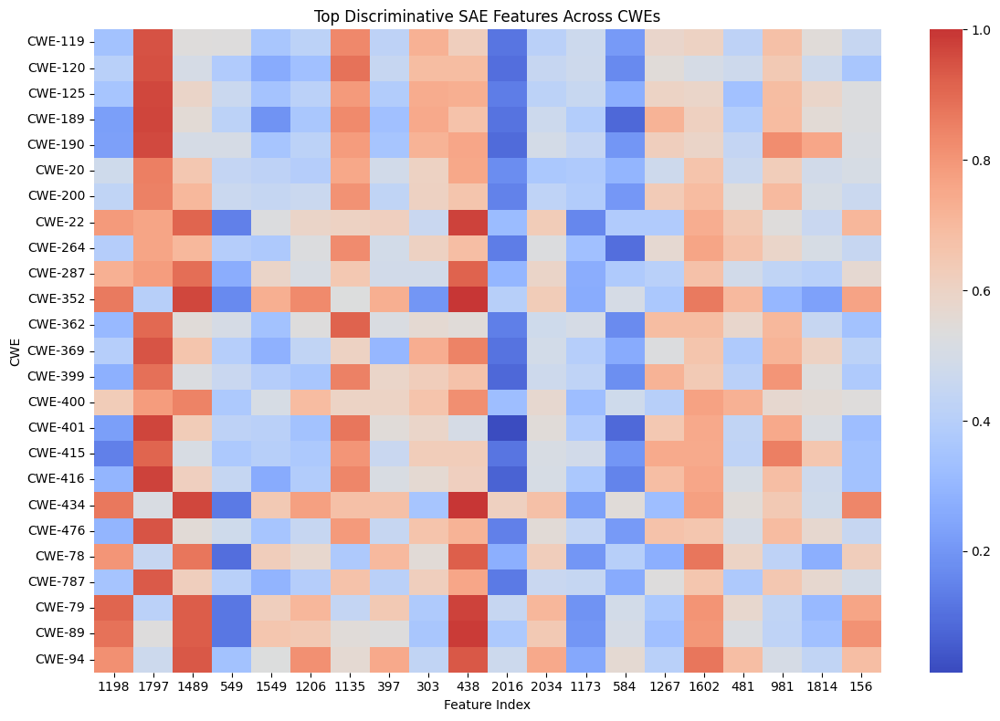

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt

heatmap_data = df.iloc[:, top_features]

plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_data,
    cmap="coolwarm",
    center=heatmap_data.values.mean(),
    yticklabels=True
)
plt.title("Top Discriminative SAE Features Across CWEs")
plt.xlabel("Feature Index")
plt.ylabel("CWE")
plt.tight_layout()
plt.show()

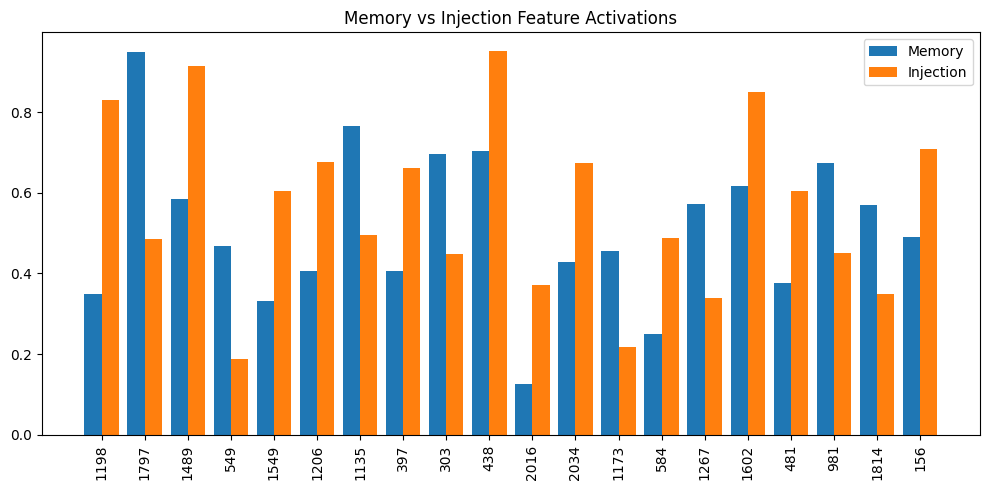

In [41]:
plt.figure(figsize=(10,5))
x = np.arange(top_k)

plt.bar(x - 0.2, memory_mean[top_features], width=0.4, label="Memory")
plt.bar(x + 0.2, injection_mean[top_features], width=0.4, label="Injection")

plt.xticks(x, top_features, rotation=90)
plt.title("Memory vs Injection Feature Activations")
plt.legend()
plt.tight_layout()
plt.show()

In [42]:
direction = memory_mean - injection_mean
direction = direction / np.linalg.norm(direction)

projection_scores = matrix @ direction

proj_df = pd.DataFrame({
    "CWE": cwes,
    "Projection": projection_scores
}).sort_values("Projection", ascending=False)

print(proj_df)

        CWE  Projection
16  CWE-415    4.144550
13  CWE-399    4.039681
4   CWE-190    4.027617
12  CWE-369    3.788393
3   CWE-189    3.731828
15  CWE-401    3.613487
19  CWE-476    3.494962
0   CWE-119    3.482304
2   CWE-125    3.482056
11  CWE-362    3.215409
1   CWE-120    3.115746
21  CWE-787    3.109651
17  CWE-416    3.037709
6   CWE-200    2.980962
8   CWE-264    2.888956
5    CWE-20    2.658527
14  CWE-400    1.824309
9   CWE-287    1.019646
7    CWE-22    1.004140
18  CWE-434    0.385486
23   CWE-89    0.241178
22   CWE-79    0.104370
24   CWE-94   -0.074452
10  CWE-352   -0.133198
20   CWE-78   -0.162493


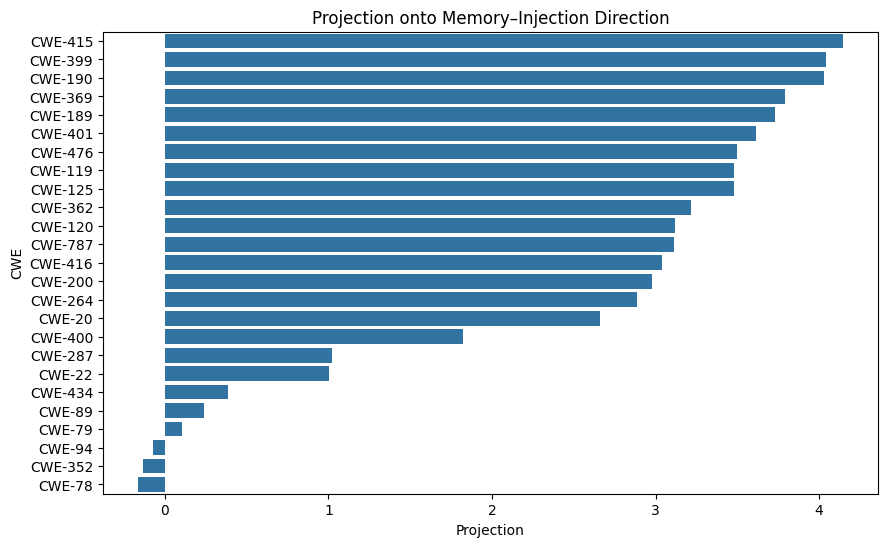

In [43]:
plt.figure(figsize=(10,6))
sns.barplot(
    x="Projection",
    y="CWE",
    data=proj_df
)
plt.title("Projection onto Memory–Injection Direction")
plt.show()

In [45]:
from scipy.stats import pearsonr

labels = np.array([1 if c in memory_cwes else 0 for c in cwes])

correlations = []
for f in range(num_features):
    r, _ = pearsonr(matrix[:, f], labels)
    correlations.append(r)

correlations = np.array(correlations)
top_corr = np.argsort(np.abs(correlations))[::-1][:20]

corr_table = pd.DataFrame({
    "Feature": top_corr,
    "Correlation_with_Memory": correlations[top_corr],
    "Delta": delta[top_corr]
})

corr_table

,Feature,Correlation_with_Memory,Delta
0,147,-0.577702,-0.083685
1,1055,-0.539239,-0.194895
2,912,-0.531518,-0.123415
3,1539,-0.526790,-0.103992
4,2017,-0.518923,-0.029099
5,14,-0.512757,-0.132802
6,1175,-0.488021,-0.074252
7,249,0.479925,0.112675
8,1698,-0.478514,-0.106460
9,945,-0.473614,-0.116933


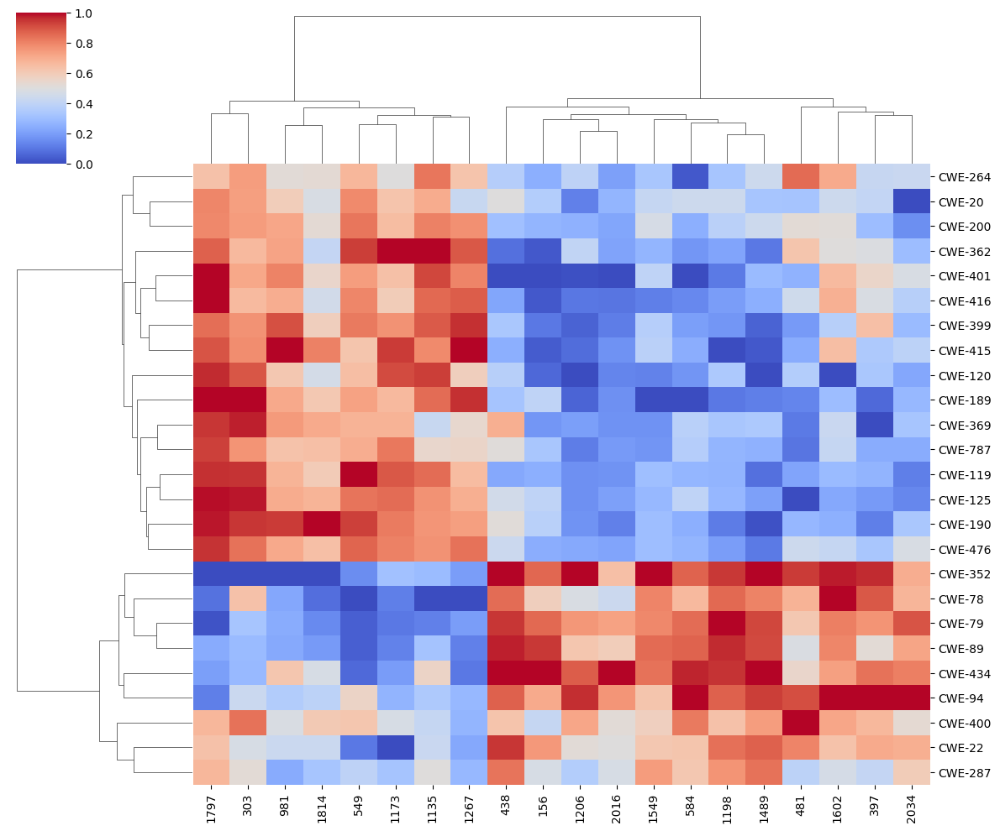

In [48]:
sns.clustermap(
    df.iloc[:, top_features],
    cmap="coolwarm",
    standard_scale=1,
    figsize=(12,10)
)
plt.show()

In [22]:
kl = (p_memory * (p_memory / (p_injection + 1e-8)).log()).sum()
kl_sym = kl + (p_injection * (p_injection / (p_memory + 1e-8)).log()).sum()

print("KL divergence between memory and injection feature distributions:", kl.item())
print("Symmetric KL divergence:", kl_sym.item())

KL divergence between memory and injection feature distributions: 32.00023651123047
Symmetric KL divergence: 32.847103118896484


CWE-416    0.973214
CWE-189    0.972222
CWE-401    0.971831
CWE-125    0.968182
CWE-190    0.962025
CWE-120    0.952381
CWE-119    0.946429
CWE-476    0.944444
CWE-369    0.943396
CWE-787    0.933735
CWE-415    0.914286
CWE-362    0.901408
CWE-399    0.885246
CWE-20     0.856287
CWE-200    0.853147
CWE-400    0.784615
CWE-287    0.783784
CWE-264    0.764706
CWE-22     0.763158
CWE-89     0.535714
CWE-434    0.516129
CWE-94     0.468750
CWE-78     0.450000
CWE-79     0.410853
CWE-352    0.400000
Name: 1797, dtype: float32


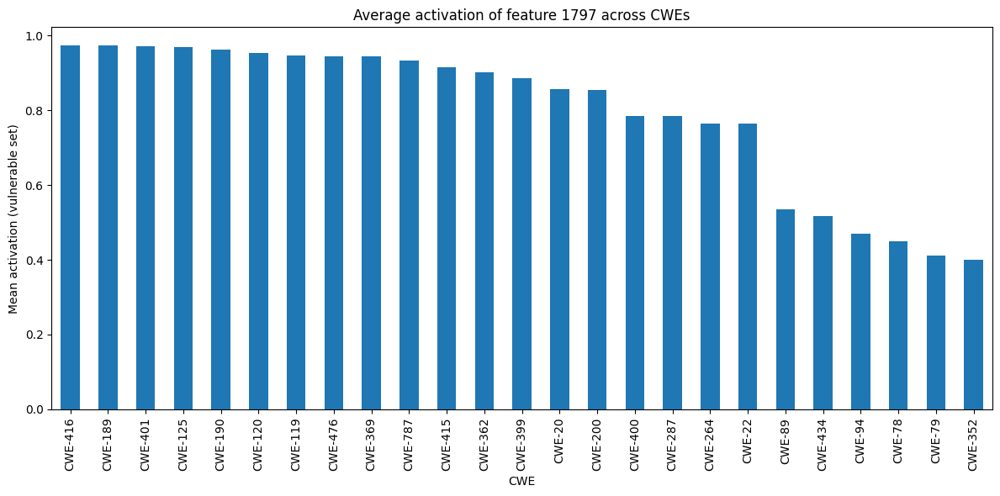

In [50]:
# df: rows = CWE ids, columns = feature indices
# it was created above with
# df = pd.DataFrame(matrix, index=cwes)

feature_idx = 1797

# pull the column and sort
feature_series = df[feature_idx]
feature_series_sorted = feature_series.sort_values(ascending=False)

print(feature_series_sorted)            # if you want to see the numbers

# bar‑plot the sorted values
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
feature_series_sorted.plot(kind="bar", color="tab:blue")
plt.title(f"Average activation of feature {feature_idx} across CWEs")
plt.ylabel("Mean activation (vulnerable set)")
plt.xlabel("CWE")
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

In [24]:
memory_feature_density = (p_memory > 0.01).float().mean().item()
injection_feature_density = (p_injection > 0.01).float().mean().item()

print("Memory feature density:", memory_feature_density)
print("Injection feature density:", injection_feature_density)

Memory feature density: 0.9970703125
Injection feature density: 0.99853515625


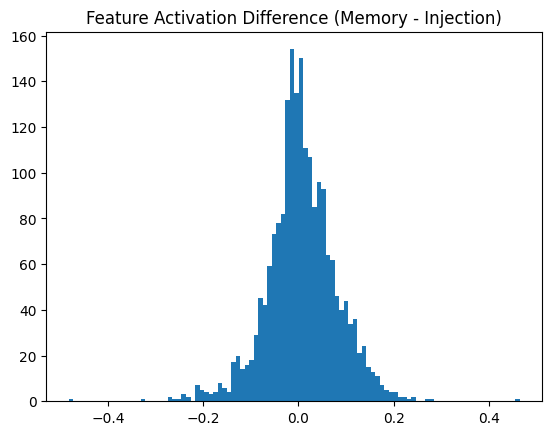

In [27]:
plt.hist(delta.cpu().numpy(), bins=100)
plt.title("Feature Activation Difference (Memory - Injection)")
plt.show()

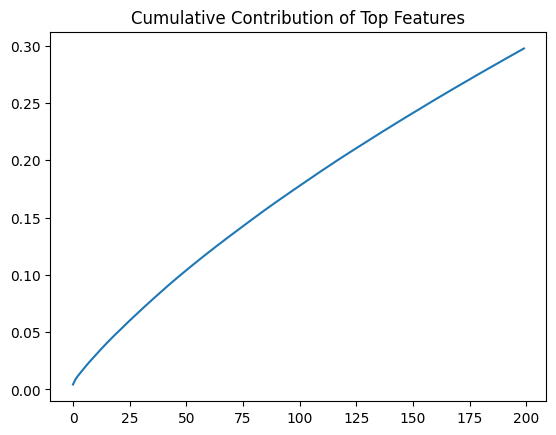

In [28]:
sorted_delta = delta.abs().sort(descending=True).values
cumulative = sorted_delta.cumsum(0) / sorted_delta.sum()

plt.plot(cumulative[:200].cpu().numpy())
plt.title("Cumulative Contribution of Top Features")
plt.show()

In [32]:
memory_mean = p_memory.mean().unsqueeze(0)
injection_mean = p_injection.mean().unsqueeze(0)

cos_sim = F.cosine_similarity(memory_mean, injection_mean, dim=0)
print("Cosine similarity between mean feature vectors:", cos_sim.item())

# since its 1.0, we can check if the vectors are identical
diff = (memory_mean - injection_mean).abs().sum()
print("L1 difference between mean feature vectors:", diff.item())

Cosine similarity between mean feature vectors: 1.0
L1 difference between mean feature vectors: 0.007536709308624268


In [33]:
cos_sim = F.cosine_similarity(memory_mean, injection_mean, dim=0)
print("Cosine similarity between mean feature vectors:", cos_sim.item())

Cosine similarity between mean feature vectors: 1.0


In [41]:
import orjson
import torch
from collections import defaultdict


top_features = [1198, 1797, 1489, 549]

feature_examples = defaultdict(list)


# sort by activation magnitude
for feat in top_features:
    feature_examples[feat] = sorted(
        feature_examples[feat],
        key=lambda x: -x["activation"]
    )[:20]

In [63]:
import torch

def batch_edge_surprise_matrix(secure: torch.Tensor, population: torch.Tensor, epsilon=1e-6):
    """
    Compute surprise matrices for a batch of samples.

    Args:
        secure: [n_secure, n_features] secure activations
        population: [n_samples, n_features] vulnerable or test samples
        epsilon: threshold for active feature

    Returns:
        [n_samples, n_features, n_features] surprise matrices
    """
    X_sec = (secure > epsilon).float()
    coact_matrix = (X_sec.T @ X_sec) / X_sec.shape[0]  # [n_features, n_features]

    X_pop = (population > epsilon).float()              # [n_samples, n_features]
    # compute outer product for each sample in batch
    sample_matrix = X_pop.unsqueeze(2) * X_pop.unsqueeze(1)  # [n_samples, n_features, n_features]

    # surprise = sample coactivates but secure rarely does
    surprise = torch.clamp(sample_matrix - coact_matrix, min=0)
    return surprise


def batch_sample_surprise_score(secure: torch.Tensor, population: torch.Tensor, epsilon=1e-6):
    """
    Compute scalar surprise score per sample in population.

    Returns:
        [n_samples] fraction of "rare but violent" co-activations
    """
    surprise = batch_edge_surprise_matrix(secure, population, epsilon)
    # count edges > 0 (upper triangle only, avoid double-counting)
    n_features = secure.shape[1]
    mask = torch.triu(torch.ones((n_features, n_features), device=surprise.device), diagonal=1)
    scores = (surprise * mask).sum(dim=(1,2)) / (n_features * (n_features-1) / 2)
    return scores


# Example usage
secure_subset = secure_subset[:, :2048]
vuln_subset   = vuln_subset[:, :2048]

# Move to GPU if available
device = "cuda" if torch.cuda.is_available() else "cpu"
secure_subset = secure_subset.to(device)
vuln_subset = vuln_subset.to(device)

scores = batch_sample_surprise_score(secure_subset, vuln_subset)
print(f"Average structural surprise (CWE {cwe}): {scores.mean():.4f}")

Average structural surprise (CWE CWE-79): 0.1059


Visualization of Rare Violations

Top violating edges: For a given CWE, pick edges with highest surprise in top percentile samples.

Feature heatmaps: Show which features are suppressed or activated unusually.

Sparse coactivation graph overlay: Highlight violated edges in red on top of the secure graph.

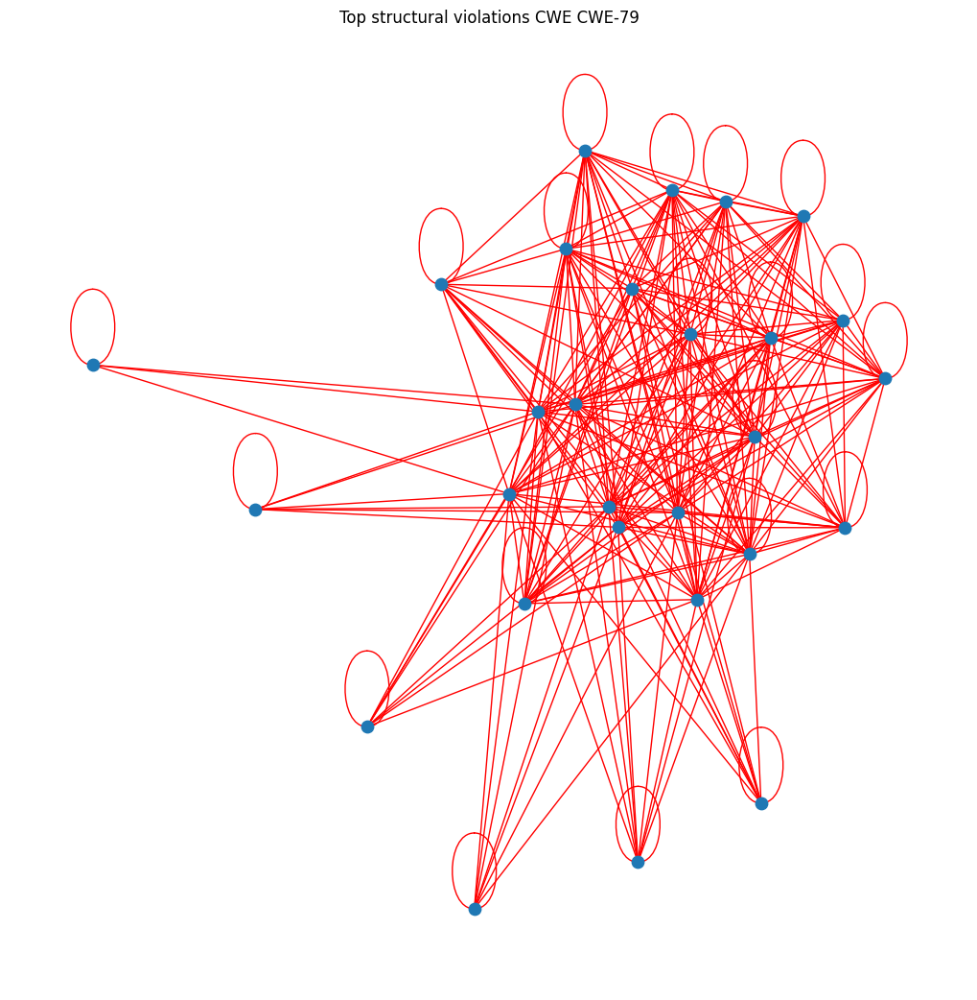

In [64]:
# Highlight violations on top 50 nodes
import networkx as nx
import matplotlib.pyplot as plt

threshold = 0.05
X_sec = (secure_subset > 1e-6).float()
coact_matrix = (X_sec.T @ X_sec) / X_sec.shape[0]

# Aggregate top 10% most surprising sample edges
surprises = torch.zeros_like(coact_matrix)
for s in vuln_subset:
    surprises += edge_surprise_matrix(secure_subset, s)

top_edges = (surprises > surprises.quantile(0.9)).nonzero(as_tuple=False)

G = nx.Graph()
for i, j in top_edges:
    G.add_edge(i.item(), j.item(), weight=surprises[i,j].item())

plt.figure(figsize=(10,10))
subG = G.subgraph(list(range(min(50, G.number_of_nodes()))))
pos = nx.spring_layout(subG, seed=42)
nx.draw(subG, pos, node_size=80, edge_color='red')
plt.title(f"Top structural violations CWE {cwe}")
plt.show()

If secure samples score ~0.10 → nothing interesting
If secure samples score ~0.02 → strong signal

In [65]:
secure_scores = [sample_surprise_score(secure_subset, s)
                 for s in secure_subset]

vuln_scores = [sample_surprise_score(secure_subset, s)
               for s in vuln_subset]

print("Secure mean:", torch.tensor(secure_scores).mean())
print("Vulnerable mean:", torch.tensor(vuln_scores).mean())


Secure mean: tensor(0.2939)
Vulnerable mean: tensor(0.2976)



Processing CWE-200...


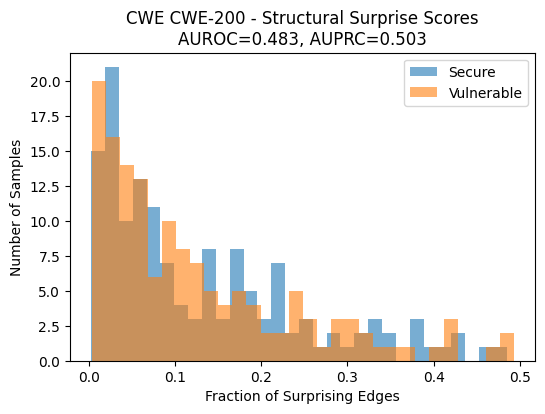

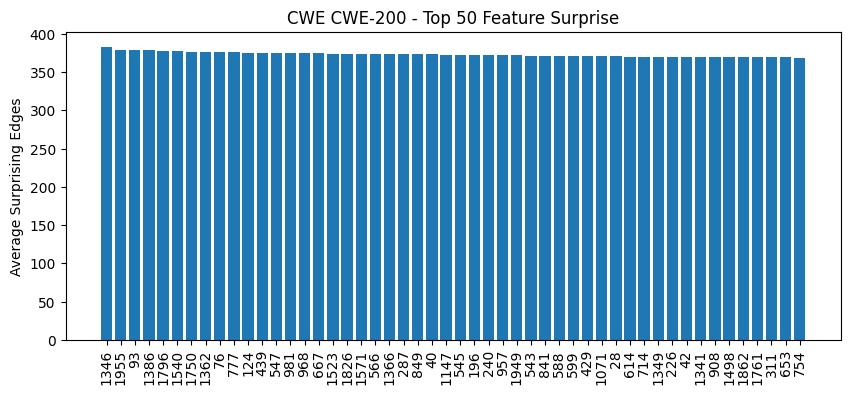

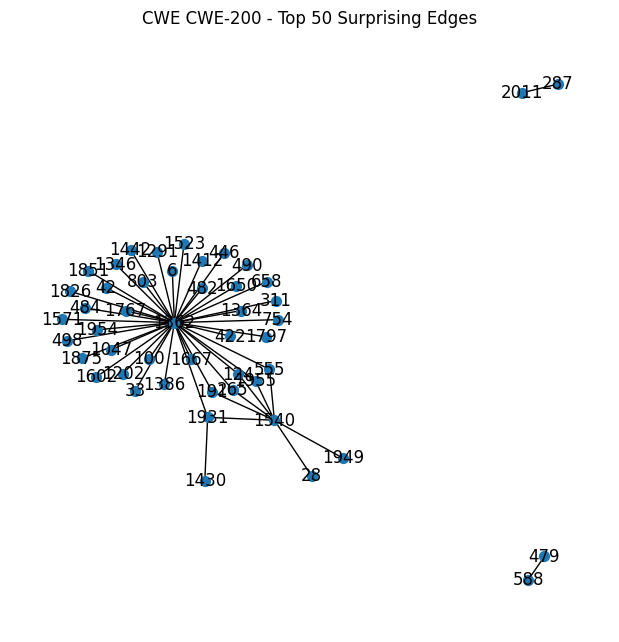


Processing CWE-400...


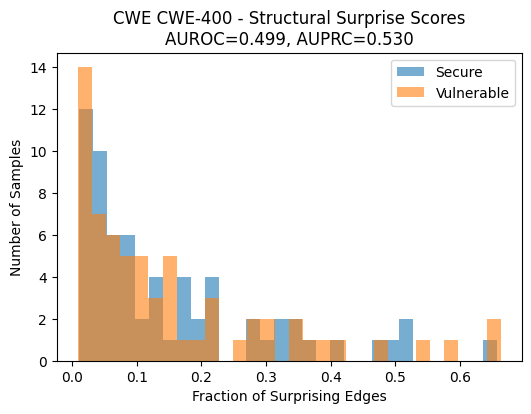

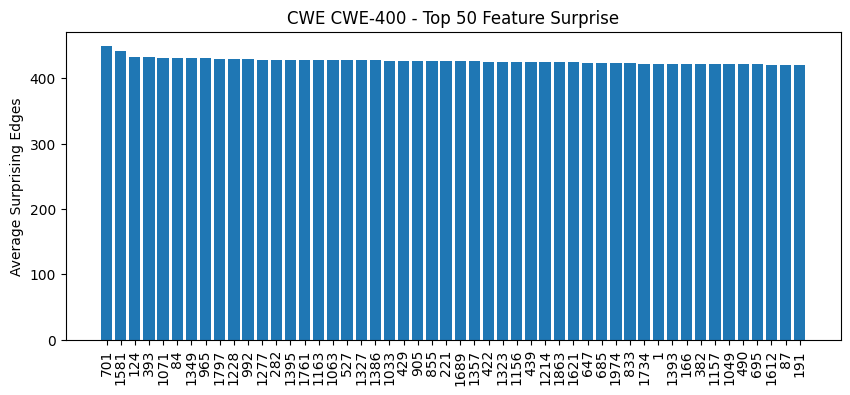

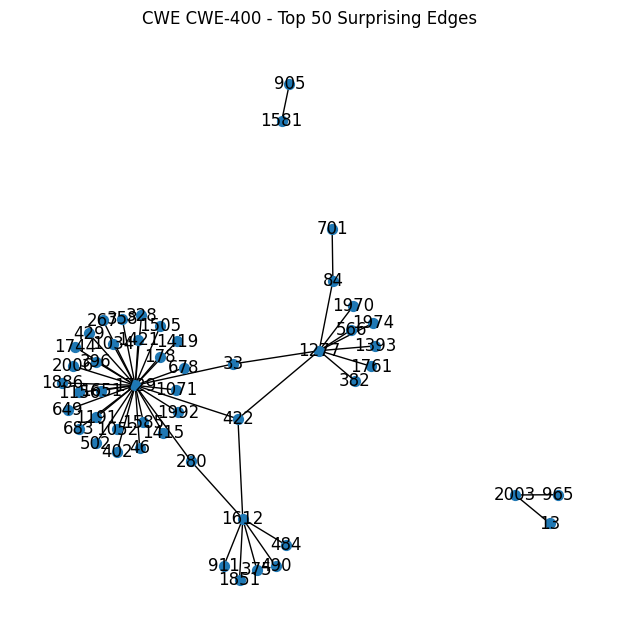


Processing CWE-125...


KeyboardInterrupt: 

In [ ]:
import torch
import matplotlib.pyplot as plt
import networkx as nx
from sklearn.metrics import roc_auc_score, average_precision_score
from tqdm import tqdm

epsilon = 1e-6
top_k_edges = 50  # for sparse graph visualization

def compute_edge_surprise_batch(secure, samples, epsilon=1e-6):
    """
    Vectorized computation of edge surprise.
    
    Args:
        secure: [n_secure, n_features] tensor
        samples: [n_samples, n_features] tensor
    Returns:
        surprise_scores: [n_samples] fraction of surprising edges
        feat_surprise: [n_features] average number of surprising edges per feature
        mean_edge_surprise: [n_features, n_features] average edge surprise over samples
    """
    n_samples, n_features = samples.shape
    # Compute secure coactivation
    X_sec = (secure > epsilon).float()
    coact_matrix = (X_sec.T @ X_sec) / X_sec.shape[0]  # [f, f]

    # Binarize samples
    X_samp = (samples > epsilon).float()  # [n_samples, f]

    # Compute outer product for all samples: [n_samples, f, f]
    sample_outer = X_samp.unsqueeze(2) * X_samp.unsqueeze(1)

    # Surprise = sample coactivates but secure rarely does
    surprise = torch.clamp(sample_outer - coact_matrix.unsqueeze(0), min=0)

    # Per-sample score: fraction of surprising edges
    triu_idx = torch.triu_indices(n_features, n_features, offset=1)
    sample_scores = surprise[:, triu_idx[0], triu_idx[1]].sum(dim=1) / len(triu_idx[0])

    # Per-feature surprise: sum over rows and average across samples
    feat_surprise = surprise.sum(dim=2).mean(dim=0)

    # Mean edge surprise over population
    mean_edge_surprise = surprise.mean(dim=0)

    return sample_scores.cpu(), feat_surprise.cpu(), mean_edge_surprise.cpu()

# Loop over CWEs
results = {}
for cwe, data in cwe_map.items():
    print(f"\nProcessing {cwe}...")
    secure = data.secure[:, :2048]  # truncate features
    vuln   = data.vulnerable[:, :2048]

    # Compute surprises vectorized
    scores_secure, _, _ = compute_edge_surprise_batch(secure, secure, epsilon)
    scores_vuln, feat_surprise, mean_edge_surprise = compute_edge_surprise_batch(secure, vuln, epsilon)

    # AUROC / AUPRC
    y_true = torch.cat([torch.zeros_like(scores_secure), torch.ones_like(scores_vuln)]).numpy()
    y_scores = torch.cat([scores_secure, scores_vuln]).numpy()
    auroc = roc_auc_score(y_true, y_scores)
    auprc = average_precision_score(y_true, y_scores)

    # Sparse graph of top violating edges
    G = nx.Graph()
    n_features = mean_edge_surprise.shape[0]
    edges_flat = mean_edge_surprise.triu(1).flatten()
    top_indices = torch.topk(edges_flat, min(top_k_edges, len(edges_flat)))[1]
    for idx in top_indices:
        i = idx // n_features
        j = idx % n_features
        if mean_edge_surprise[i, j] > 0:
            G.add_edge(i.item(), j.item(), weight=mean_edge_surprise[i, j].item())

    # Store results
    results[cwe] = {
        "scores_secure": scores_secure,
        "scores_vuln": scores_vuln,
        "auroc": auroc,
        "auprc": auprc,
        "feat_surprise": feat_surprise,
        "graph": G
    }

    # Histogram plot
    plt.figure(figsize=(6,4))
    plt.hist(scores_secure, bins=30, alpha=0.6, label="Secure")
    plt.hist(scores_vuln, bins=30, alpha=0.6, label="Vulnerable")
    plt.title(f"CWE {cwe} - Structural Surprise Scores\nAUROC={auroc:.3f}, AUPRC={auprc:.3f}")
    plt.xlabel("Fraction of Surprising Edges")
    plt.ylabel("Number of Samples")
    plt.legend()
    plt.show()

    # Feature surprise bar plot (top 50 features)
    top_features = torch.topk(feat_surprise, 50).indices
    plt.figure(figsize=(10,4))
    plt.bar(range(50), feat_surprise[top_features].numpy())
    plt.xticks(range(50), top_features.numpy(), rotation=90)
    plt.title(f"CWE {cwe} - Top 50 Feature Surprise")
    plt.ylabel("Average Surprising Edges")
    plt.show()

    # Sparse coactivation graph
    plt.figure(figsize=(6,6))
    pos = nx.spring_layout(G, seed=42)
    nx.draw(G, pos, node_size=50, with_labels=True)
    plt.title(f"CWE {cwe} - Top {top_k_edges} Surprising Edges")
    plt.show()

In [143]:
cwe = "CWE-787"
secure_subset = cwe_map[cwe].secure[:, :2048]
vuln_subset   = cwe_map[cwe].vulnerable[:, :2048]

scores_secure = [sample_surprise_score(secure_subset, s)
                 for s in secure_subset]

mean_edge_surprise = torch.zeros((secure_subset.shape[1], secure_subset.shape[1]))
for s in vuln_subset:
    surprise = edge_surprise_matrix(secure_subset, s)
    mean_edge_surprise += surprise
    
mean_edge_surprise /= len(vuln_subset)  

In [ ]:
# ===== GLOBAL EDGE STATISTICS =====

mean_surprise = mean_edge_surprise.mean().item()
max_surprise = mean_edge_surprise.max().item()
std_surprise = mean_edge_surprise.std().item()

nonzero_edges = (mean_edge_surprise > 0).float().mean().item()

print("\n=== Global Edge Stats ===")
print("Mean edge surprise:", mean_surprise)
print("Std edge surprise:", std_surprise)
print("Max edge surprise:", max_surprise)
print("Fraction non-zero edges:", nonzero_edges)


=== Global Edge Stats ===
Mean edge surprise: 0.12207255512475967
Std edge surprise: 0.0685080885887146
Max edge surprise: 0.28349563479423523
Fraction non-zero edges: 0.9935503005981445


In [153]:
# ===== EDGE CONCENTRATION =====

flat = mean_edge_surprise.triu(1).flatten()
flat_sorted, _ = torch.sort(flat, descending=True)

top_1pct = flat_sorted[:int(0.01 * len(flat))]
top_5pct = flat_sorted[:int(0.05 * len(flat))]

print("\n=== Edge Concentration ===")
print("Top 1% mean:", top_1pct.mean().item())
print("Top 5% mean:", top_5pct.mean().item())
print("Top 1% / global mean ratio:", top_1pct.mean().item() / (mean_surprise + 1e-9))



=== Edge Concentration ===
Top 1% mean: 0.251226544380188
Top 5% mean: 0.2368442565202713
Top 1% / global mean ratio: 2.058010025803272


In [146]:
# ===== PERMUTATION TEST =====

n_perm = 50
perm_means = []

for _ in range(n_perm):
    perm = torch.randperm(vuln.shape[0])
    fake = vuln[perm]
    _, _, fake_mean = compute_edge_surprise_batch(secure, fake, epsilon)
    perm_means.append(fake_mean.unsqueeze(0))

perm_means = torch.cat(perm_means, dim=0)

# empirical p-value per edge
pvals = ((perm_means >= mean_edge_surprise.unsqueeze(0)).float().mean(dim=0))

alpha = 0.01
significant_mask = (pvals < alpha)

print("\n=== Permutation Significance ===")
print("Mean p-value:", pvals.mean().item())
print("Fraction significant edges (p<0.01):", significant_mask.float().mean().item())
print("Min p-value:", pvals.min().item())



=== Permutation Significance ===
Mean p-value: 0.5860419273376465
Fraction significant edges (p<0.01): 0.4139580726623535
Min p-value: 0.0


In [149]:
# ===== FEATURE CENTRALITY =====

degree_strength = mean_edge_surprise.sum(dim=1)

top_feat = torch.topk(degree_strength, 20)

print("\n=== Top 20 Structural Features ===")
for idx, val in zip(top_feat.indices.tolist(), top_feat.values.tolist()):
    print(f"Feature {idx}: {val}")



=== Top 20 Structural Features ===
Feature 1863: 373.1439514160156
Feature 768: 372.9839172363281
Feature 1189: 371.14923095703125
Feature 957: 368.9468688964844
Feature 667: 367.144287109375
Feature 1193: 366.98114013671875
Feature 1153: 366.9423828125
Feature 1955: 366.9295654296875
Feature 1131: 366.622802734375
Feature 382: 366.60552978515625
Feature 1099: 366.35174560546875
Feature 226: 366.3426208496094
Feature 439: 366.27496337890625
Feature 1624: 365.7913818359375
Feature 1354: 364.9440612792969
Feature 257: 364.8638610839844
Feature 1289: 364.5422058105469
Feature 1579: 364.4156799316406
Feature 566: 364.24462890625
Feature 754: 364.18316650390625


In [150]:
# ===== SPECTRAL ANALYSIS =====

eigvals = torch.linalg.eigvalsh(mean_edge_surprise)
eigvals_sorted, _ = torch.sort(eigvals, descending=True)

print("\n=== Spectral Structure ===")
print("Top eigenvalue:", eigvals_sorted[0].item())
print("Second eigenvalue:", eigvals_sorted[1].item())
print("Top / second ratio:", eigvals_sorted[0].item() / (eigvals_sorted[1].item() + 1e-9))



=== Spectral Structure ===
Top eigenvalue: 284.2475891113281
Second eigenvalue: 14.509244918823242
Top / second ratio: 19.590791297690146


In [151]:
_, _, secure_mean_edge = compute_edge_surprise_batch(secure, secure, epsilon)

print("\n=== Secure Self Surprise ===")
print("Mean secure edge surprise:", secure_mean_edge.mean().item())
print("Max secure edge surprise:", secure_mean_edge.max().item())



=== Secure Self Surprise ===
Mean secure edge surprise: 0.13447195291519165
Max secure edge surprise: 0.25


Top 10 surprising feature pairs (i, j, surprise):
(800, 1307, 0.9578313231468201)
(852, 1307, 0.9578313231468201)
(1217, 1307, 0.9578313231468201)
(97, 1307, 0.9518072605133057)
(207, 1307, 0.9518072605133057)
(239, 1307, 0.9518072605133057)
(347, 1307, 0.9518072605133057)
(485, 1307, 0.9518072605133057)
(494, 1307, 0.9518072605133057)
(1307, 1342, 0.9518072605133057)


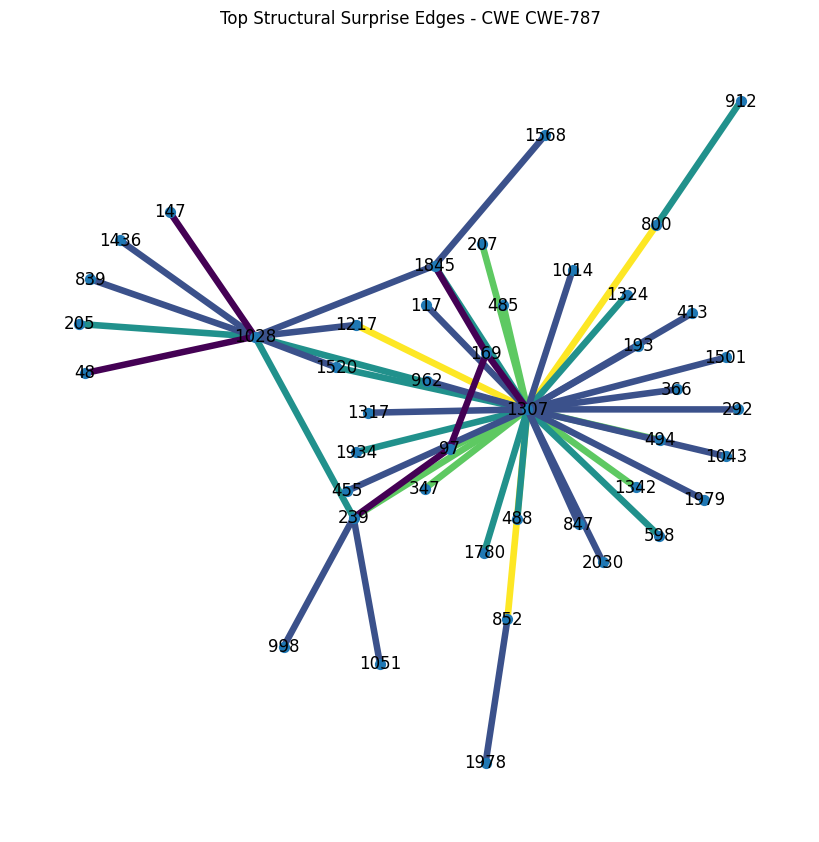

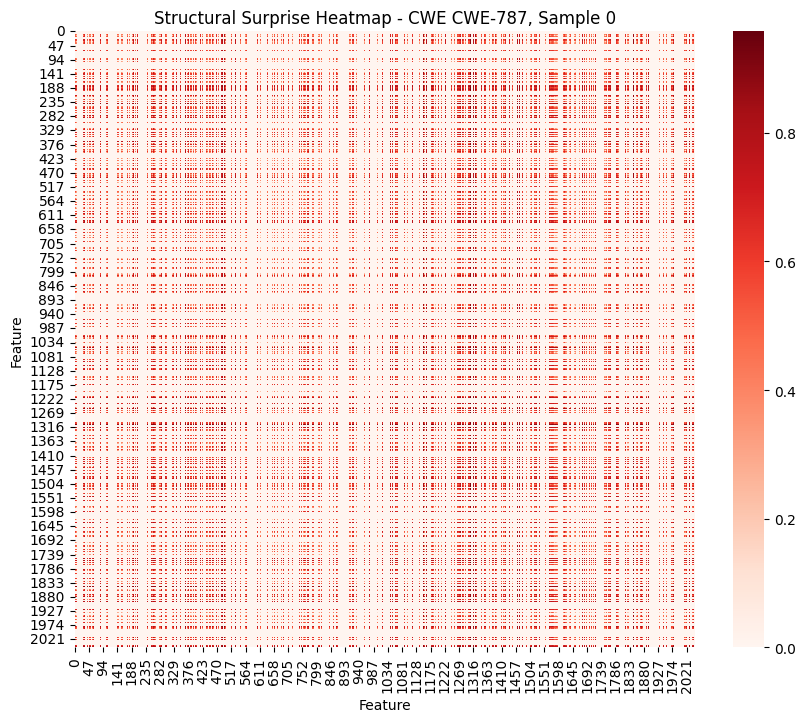

In [154]:
import torch
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict

# === 1️⃣ Edge surprise computation ===
def edge_surprise_matrix(secure: torch.Tensor, sample: torch.Tensor, epsilon=1e-6):
    """Compute per-feature-pair surprise: co-activation in sample but rare in secure code."""
    X_sec = (secure > epsilon).float()
    coact_matrix = (X_sec.T @ X_sec) / X_sec.shape[0]

    X_samp = (sample > epsilon).float()
    sample_matrix = X_samp.unsqueeze(1) * X_samp.unsqueeze(0)

    # Surprise = sample co-activates but secure rarely does
    surprise = torch.clamp(sample_matrix - coact_matrix, min=0)
    return surprise

# === 2️⃣ Pick CWE and sample ===
cwe = "CWE-787"
secure_subset = cwe_map[cwe].secure[:, :2048]  # truncate features
vuln_subset   = cwe_map[cwe].vulnerable[:, :2048]

# Pick a sample to inspect
sample_idx = 0
sample = vuln_subset[sample_idx]

surprise_matrix = edge_surprise_matrix(secure_subset, sample)

# === 3️⃣ Identify top surprising edges ===
# Only consider upper triangle (i<j)
n_features = surprise_matrix.shape[0]
edges = []
for i in range(n_features):
    for j in range(i+1, n_features):
        if surprise_matrix[i, j] > 0:
            edges.append((i, j, surprise_matrix[i, j].item()))

# Sort edges by surprise
edges_sorted = sorted(edges, key=lambda x: x[2], reverse=True)
top_edges = edges_sorted[:50]  # top 50 surprising pairs

print("Top 10 surprising feature pairs (i, j, surprise):")
for e in top_edges[:10]:
    print(e)

# === 4️⃣ Sparse graph of top surprising edges ===
G = nx.Graph()
for i, j, w in top_edges:
    G.add_edge(i, j, weight=w)

plt.figure(figsize=(8, 8))
pos = nx.spring_layout(G, seed=42)
weights = [G[u][v]['weight']*5 for u,v in G.edges()]  # scale for visibility
nx.draw(G, pos, node_size=50, width=weights, with_labels=True, edge_color=weights, edge_cmap=plt.cm.viridis)
plt.title(f"Top Structural Surprise Edges - CWE {cwe}")
plt.show()

# === 5️⃣ Heatmap of surprise matrix (optional) ===
plt.figure(figsize=(10,8))
sns.heatmap(surprise_matrix.numpy(), cmap="Reds")
plt.title(f"Structural Surprise Heatmap - CWE {cwe}, Sample {sample_idx}")
plt.xlabel("Feature")
plt.ylabel("Feature")
plt.show()

In [163]:
top_edges = (surprises > surprises.quantile(0.9)).nonzero()

cluster_features = set()

for i, j in top_edges:
    cluster_features.add(i.item())
    cluster_features.add(j.item())

cluster_features = sorted(list(cluster_features))
print("Cluster feature IDs:", cluster_features)
print("Number of features in cluster:", len(cluster_features))


Cluster feature IDs: [1, 2, 3, 4, 6, 7, 10, 11, 13, 14, 15, 16, 17, 20, 25, 28, 29, 30, 32, 33, 37, 38, 40, 41, 42, 43, 46, 49, 51, 52, 54, 56, 58, 61, 63, 66, 69, 71, 73, 76, 77, 78, 79, 80, 81, 83, 84, 89, 90, 91, 92, 93, 98, 99, 100, 103, 105, 108, 114, 115, 118, 124, 126, 130, 131, 136, 137, 138, 139, 141, 143, 144, 145, 147, 149, 150, 151, 154, 156, 158, 159, 160, 165, 166, 170, 172, 173, 174, 178, 181, 183, 186, 189, 191, 193, 194, 196, 200, 201, 210, 211, 213, 216, 218, 219, 221, 223, 226, 227, 233, 235, 237, 240, 241, 243, 249, 251, 253, 256, 257, 259, 260, 262, 263, 265, 267, 268, 269, 271, 272, 274, 280, 281, 282, 283, 284, 285, 286, 287, 290, 292, 294, 295, 298, 299, 300, 303, 305, 309, 310, 311, 317, 323, 327, 328, 334, 338, 342, 343, 349, 350, 354, 357, 358, 359, 361, 365, 366, 371, 372, 375, 378, 382, 383, 384, 385, 386, 387, 388, 390, 391, 392, 393, 396, 397, 399, 402, 406, 408, 417, 421, 422, 423, 426, 429, 430, 432, 435, 437, 438, 439, 440, 441, 444, 445, 446, 448, 452

In [165]:
feature_violation_score = surprises.sum(dim=1)

cluster_scores = {
    f: feature_violation_score[f].item()
    for f in cluster_features
}

sorted_cluster = sorted(cluster_scores.items(),
                        key=lambda x: x[1],
                        reverse=True)

print("Top violating features:")
for f, score in sorted_cluster[:20]:
    print(f"Feature {f}: {score:.4f}")


Top violating features:
Feature 90: 136303.2188
Feature 1393: 135753.7656
Feature 1289: 135234.3438
Feature 815: 134993.2812
Feature 957: 134843.0469
Feature 564: 134811.5938
Feature 608: 134469.9844
Feature 28: 134416.9062
Feature 42: 134141.4531
Feature 788: 134096.0469
Feature 495: 134058.1250
Feature 868: 133982.8594
Feature 685: 133827.5469
Feature 1524: 133774.1719
Feature 1035: 133714.8281
Feature 1761: 133679.2812
Feature 653: 133630.7656
Feature 158: 133594.5469
Feature 733: 133439.7812
Feature 1654: 133427.4375


In [166]:
epsilon = 1e-6

secure_bin = (secure_subset > epsilon).float()
vuln_bin   = (vuln_subset > epsilon).float()

delta = vuln_bin.mean(dim=0) - secure_bin.mean(dim=0)

for f in cluster_features[:20]:
    print(f"Feature {f}: Δ={delta[f].item():.4f}")


Feature 1: Δ=0.0000
Feature 2: Δ=-0.0241
Feature 3: Δ=-0.0181
Feature 4: Δ=-0.0060
Feature 6: Δ=-0.0120
Feature 7: Δ=0.0000
Feature 10: Δ=-0.0723
Feature 11: Δ=-0.0120
Feature 13: Δ=0.0181
Feature 14: Δ=-0.0542
Feature 15: Δ=-0.0241
Feature 16: Δ=-0.0422
Feature 17: Δ=-0.0422
Feature 20: Δ=-0.0060
Feature 25: Δ=-0.0120
Feature 28: Δ=-0.0181
Feature 29: Δ=0.0120
Feature 30: Δ=-0.0663
Feature 32: Δ=-0.0241
Feature 33: Δ=-0.0181


In [167]:
import networkx as nx

G = nx.Graph()
for i, j in top_edges:
    G.add_edge(i.item(), j.item())

centrality = nx.degree_centrality(G)

sorted_central = sorted(centrality.items(),
                        key=lambda x: x[1],
                        reverse=True)

top_core = [f for f, _ in sorted_central[:30]]

print("Core cluster features:", top_core)


Core cluster features: [90, 564, 495, 608, 126, 685, 815, 1524, 866, 1244, 1846, 221, 1120, 788, 334, 868, 1327, 466, 857, 81, 154, 384, 430, 957, 1756, 439, 1048, 1393, 1579, 233]


In [168]:
def inspect_feature(feature_id, token_acts, tokens, top_k=20):
    values = token_acts[:, feature_id]
    idx = torch.topk(values, top_k).indices
    return [tokens[i] for i in idx]

coact_sec = (secure_bin.T @ secure_bin) / secure_bin.shape[0]
coact_vuln = (vuln_bin.T @ vuln_bin) / vuln_bin.shape[0]

edge_shift = coact_vuln - coact_sec


In [169]:
edge_shift

tensor([[-0.0060, -0.0060, -0.0060,  ..., -0.0181,  0.0000, -0.0060],
        [-0.0060,  0.0000, -0.0301,  ..., -0.0120, -0.0120,  0.0181],
        [-0.0060, -0.0301, -0.0241,  ..., -0.0181, -0.0241, -0.0241],
        ...,
        [-0.0181, -0.0120, -0.0181,  ..., -0.0120, -0.0120, -0.0060],
        [ 0.0000, -0.0120, -0.0241,  ..., -0.0120, -0.0361, -0.0361],
        [-0.0060,  0.0181, -0.0241,  ..., -0.0060, -0.0361,  0.0000]])

In [170]:
edge_shift_abs_mean = edge_shift.abs().mean()
print(edge_shift_abs_mean)


tensor(0.0165)


In [171]:
significant = (edge_shift.abs() > 0.01).float().mean()
print("Fraction significant edges (%):", significant.item() * 100)

Fraction significant edges (%): 62.33570575714111


In [172]:
secure_bin = (secure_subset > 0).float()
vuln_bin   = (vuln_subset > 0).float()

coact_sec  = (secure_bin.T @ secure_bin) / secure_bin.shape[0]
coact_vuln = (vuln_bin.T @ vuln_bin) / vuln_bin.shape[0]

edge_shift = coact_vuln - coact_sec

perm = torch.randperm(secure_bin.shape[0])
fake_bin = secure_bin[perm[:vuln_bin.shape[0]]]

fake_coact = (fake_bin.T @ fake_bin) / fake_bin.shape[0]
fake_edge_shift = fake_coact - coact_sec


In [156]:
pos_edges = (edge_shift > 0.01).nonzero(as_tuple=False)
neg_edges = (edge_shift < -0.01).nonzero(as_tuple=False)

perm = torch.randperm(len(vuln_subset))
fake_vuln = secure_subset[perm]

# Compute edge_shift between secure and fake_vuln.

# If magnitude is similar → your signal is noise.
# If real edge_shift >> shuffled → real structural effect.

fake_bin = (fake_vuln > 0).float()
fake_coact = (fake_bin.T @ fake_bin) / fake_bin.shape[0]
fake_edge_shift = fake_coact - coact_sec

fake_edge_shift_abs_mean = fake_edge_shift.abs().mean()
print("Fraction fake significant edges (%):", (fake_edge_shift.abs() > 0.01).float().mean().item() * 100)
print("Mean absolute edge shift (real):", edge_shift_abs_mean.item())
print("Mean absolute edge shift (fake):", fake_edge_shift_abs_mean.item())


Fraction fake significant edges (%): 87.16886043548584
Mean absolute edge shift (real): 0.006532623432576656
Mean absolute edge shift (fake): 0.05511626973748207


In [117]:
secure_bin = (secure_subset > 0).float()
vuln_bin   = (vuln_subset > 0).float()

coact_sec  = (secure_bin.T @ secure_bin) / secure_bin.shape[0]
coact_vuln = (vuln_bin.T   @ vuln_bin)   / vuln_bin.shape[0]

edge_shift_obs = coact_vuln - coact_sec   # shape [d, d]


In [118]:
import torch

all_data = torch.cat([secure_subset, vuln_subset], dim=0)
labels = torch.cat([
    torch.zeros(len(secure_subset)),
    torch.ones(len(vuln_subset))
])

n_secure = len(secure_subset)
n_vuln   = len(vuln_subset)

n_perm = 100  # increase to 500+ for paper-level confidence

perm_shifts = []

for _ in range(n_perm):
    perm_idx = torch.randperm(len(all_data))
    perm_labels = labels[perm_idx]

    perm_secure = all_data[perm_labels == 0]
    perm_vuln   = all_data[perm_labels == 1]

    perm_secure_bin = (perm_secure > 0).float()
    perm_vuln_bin   = (perm_vuln > 0).float()

    perm_coact_sec  = (perm_secure_bin.T @ perm_secure_bin) / perm_secure_bin.shape[0]
    perm_coact_vuln = (perm_vuln_bin.T   @ perm_vuln_bin)   / perm_vuln_bin.shape[0]

    perm_shifts.append(perm_coact_vuln - perm_coact_sec)

perm_shifts = torch.stack(perm_shifts)  # shape [n_perm, d, d]


In [119]:
import torch

all_data = torch.cat([secure_subset, vuln_subset], dim=0)
labels = torch.cat([
    torch.zeros(len(secure_subset)),
    torch.ones(len(vuln_subset))
])

n_secure = len(secure_subset)
n_vuln   = len(vuln_subset)

n_perm = 10  # increase to 500+ for paper-level confidence

perm_shifts = []

for _ in range(n_perm):
    perm_idx = torch.randperm(len(all_data))
    perm_labels = labels[perm_idx]

    perm_secure = all_data[perm_labels == 0]
    perm_vuln   = all_data[perm_labels == 1]

    perm_secure_bin = (perm_secure > 0).float()
    perm_vuln_bin   = (perm_vuln > 0).float()

    perm_coact_sec  = (perm_secure_bin.T @ perm_secure_bin) / perm_secure_bin.shape[0]
    perm_coact_vuln = (perm_vuln_bin.T   @ perm_vuln_bin)   / perm_vuln_bin.shape[0]

    perm_shifts.append(perm_coact_vuln - perm_coact_sec)

perm_shifts = torch.stack(perm_shifts)  # shape [n_perm, d, d]


In [120]:
obs_abs = edge_shift_obs.abs()

perm_abs = perm_shifts.abs()

p_values = (
    (perm_abs >= obs_abs.unsqueeze(0)).float().sum(dim=0) + 1
) / (n_perm + 1)


#p_values shape = [d, d]

In [111]:
# Now you can threshold p-values to find significant edges, e.g. p < 0.05
significant_edges = (p_values < 0.05).nonzero(as_tuple=False)   

In [124]:
significant_edges

tensor([], size=(0, 2), dtype=torch.int64)

In [125]:
def benjamini_hochberg(pvals, alpha=0.05):
    flat = pvals.flatten()
    sorted_p, idx = torch.sort(flat)

    m = len(flat)
    thresholds = torch.arange(1, m+1) / m * alpha

    below = sorted_p <= thresholds
    if below.sum() == 0:
        cutoff = 0
    else:
        cutoff = sorted_p[below].max()

    return pvals <= cutoff

significant_mask = benjamini_hochberg(p_values, alpha=0.05)


In [30]:
def benjamini_hochberg(pvals, alpha=0.05):
    flat = pvals.flatten()
    sorted_p, idx = torch.sort(flat)

    m = len(flat)
    thresholds = torch.arange(1, m+1) / m * alpha

    below = sorted_p <= thresholds
    if below.sum() == 0:
        cutoff = 0
    else:
        cutoff = sorted_p[below].max()

    return pvals <= cutoff

significant_mask = benjamini_hochberg(p_values, alpha=0.05)


In [126]:
num_sig = significant_mask.sum().item()
total_edges = significant_mask.numel()

print("Significant edges:", num_sig)
print("Fraction significant (%):", 100 * num_sig / total_edges)


Significant edges: 0
Fraction significant (%): 0.0


In [115]:
strong_mask = (edge_shift_obs.abs() > 0.01)
final_mask = significant_mask & strong_mask


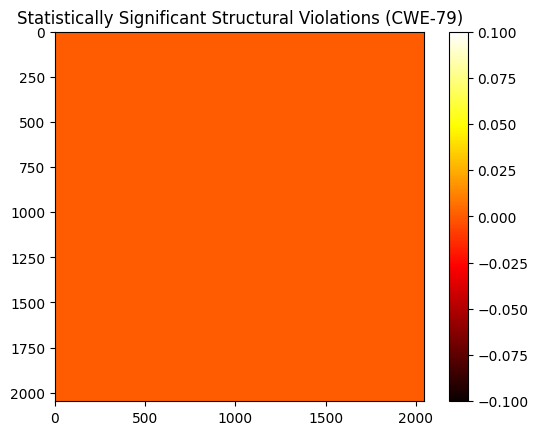

In [155]:
import matplotlib.pyplot as plt

plt.imshow(final_mask.float().cpu(), cmap="hot")
plt.title("Statistically Significant Structural Violations (CWE-79)")
plt.colorbar()
plt.show()
